In [38]:
# 9,CongestionWindow
# 17,SmoothedRTT
# 20,RetransmissionTimeout
# 21,SocketSendBufferSize
# 22,SocketSendBufferBytes
# 23,SocketReceiveBufferSize
# 24,SocketReceiveBufferBytes
# 25,UnacknowledgedBytes

# # With ECN and no ECN

In [39]:
import numpy as np
import matplotlib.pyplot as plt
import time
import pandas as pd
import matplotlib.pyplot as plt
# from gym import wrappers
# from gym import spaces
import math
import random
import re
import os
import sys
import seaborn as sns

# import gym
# import tensorflow as tf
# from tensorflow.keras import layers
col = ['Direction', 'Hash', 'Time', 'LocalIP', 'LocalPort', 'ForeignIP', 'ForeignPort', 'SlowStartThreshold', 'CongestionWindow', 'BandwidthControlledWindow', 'SendingWindow', 'ReceiveWindow', 'SendingWindowScalingFactor', 'ReceiveWindowScalingFactor', 'TCPFiniteStateMachine',
       'MaximumSegmentSize', 'SmoothedRTT', 'SACKEnabled', 'TCPFlags', 'RetransmissionTimeout', 'SocketSendBufferSize', 'SocketSendBufferBytes', 'SocketReceiveBufferSize', 'SocketReceiveBufferBytes', 'UnacknowledgedBytes', 'ReassemblyQueue', 'Flowid', 'Flowtype']


In [40]:
import re

def contains_1_or_2(input_string):
    if '2' in input_string:
        return 2
    elif '1' in input_string:
        return 1
    else:
        return 0

# Example usage:
test_string = "abc123xyz"
result = contains_1_or_2(test_string)
print("Result:", result)


Result: 2


In [41]:
# plt.rcParams.update({'figure.figsize':(8,6), 'figure.dpi':100, 'font.size':16})

In [42]:
def functionfilenameandpath(path='./', extension='.log'):
    filepaths = []
    filenames = []

    for root, _, files_list in os.walk(path):
        for file_name in files_list:
            if file_name.endswith(extension):
                file_name_path = os.path.join(root, file_name)
                filenames.append(file_name)
                filepaths.append(file_name_path)

    return filenames, filepaths

In [43]:
folderpath="./datatest1"
filenames,filepaths=functionfilenameandpath(folderpath,'.log')

filepaths.sort()
filenames.sort()
print(filenames)

['codel1_ecn.siftr.log', 'codel1_noecn.siftr.log', 'codel2_ecn.siftr.log', 'codel2_noecn.siftr.log', 'fqcodel1_ecn.siftr.log', 'fqcodel1_noecn.siftr.log', 'fqcodel2_ecn.siftr.log', 'fqcodel2_noecn.siftr.log', 'fqpie1_ecn.siftr.log', 'fqpie1_noecn.siftr.log', 'fqpie2_ecn.siftr.log', 'fqpie2_noecn.siftr.log', 'l4s1_ecn.siftr.log', 'l4s1_noecn.siftr.log', 'l4s2_ecn.siftr.log', 'l4s2_noecn.siftr.log', 'pie1_ecn.siftr.log', 'pie1_noecn.siftr.log', 'pie2_ecn.siftr.log', 'pie2_noecn.siftr.log']


In [44]:
# for index in range(len(filenames)):
#     print("..................>>>>>>>>>>>>>>>>>")
#     print(filenames[index])
#     print(contains_1_or_2(filenames[index]))
#     print("..................>>>>>>>>>>>>>>>>>")

In [45]:
def remove_outliers_iqr(df, column_name):
    """
    Remove outliers from a specified column in a DataFrame using the IQR method.
    
    Parameters:
    df (pd.DataFrame): The DataFrame.
    column_name (str): The name of the column from which to remove outliers.
    
    Returns:
    pd.DataFrame: The DataFrame with outliers removed.
    """
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    return df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]

codel1_ecn.siftr.log
count    9816.000000
mean        0.174764
std         0.054547
min         0.000000
25%         0.128125
50%         0.162188
75%         0.210000
max         0.384062
Name: SmoothedRTT, dtype: float64
17842    0.000000
17947    0.173125
17948    0.173125
18077    0.171563
18078    0.171563
Name: SmoothedRTT, dtype: float64
55435    0.163750
55436    0.163750
55485    0.155938
55487    0.155938
55488    0.155938
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


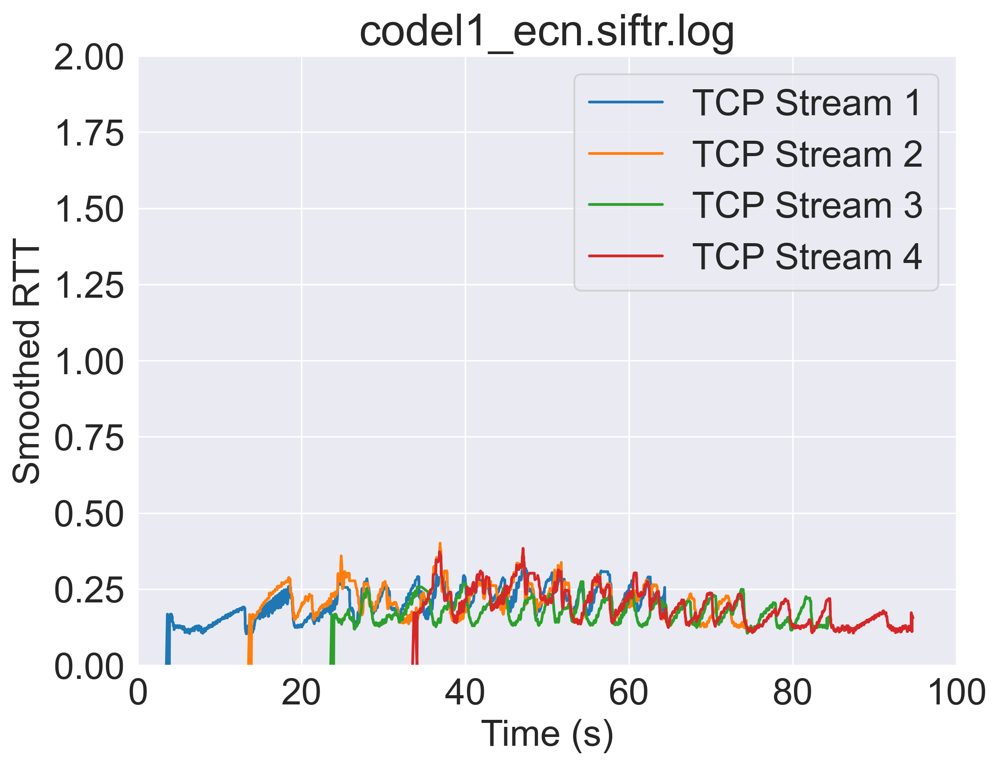

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


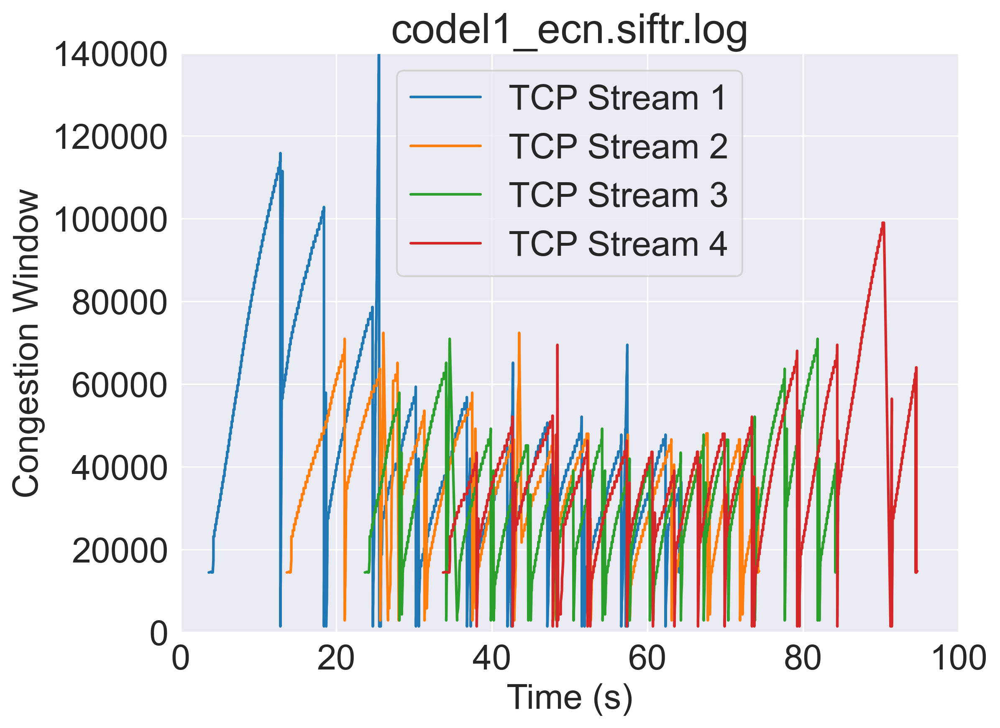

codel1_noecn.siftr.log
count    9796.000000
mean        0.172176
std         0.034747
min         0.000000
25%         0.153672
50%         0.175313
75%         0.190312
max         0.660625
Name: SmoothedRTT, dtype: float64
16193    0.000000
16300    0.659375
16301    0.659375
16372    0.592187
16373    0.592187
Name: SmoothedRTT, dtype: float64
53220    0.482812
53221    0.482812
53271    0.437500
53273    0.437500
53274    0.437500
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


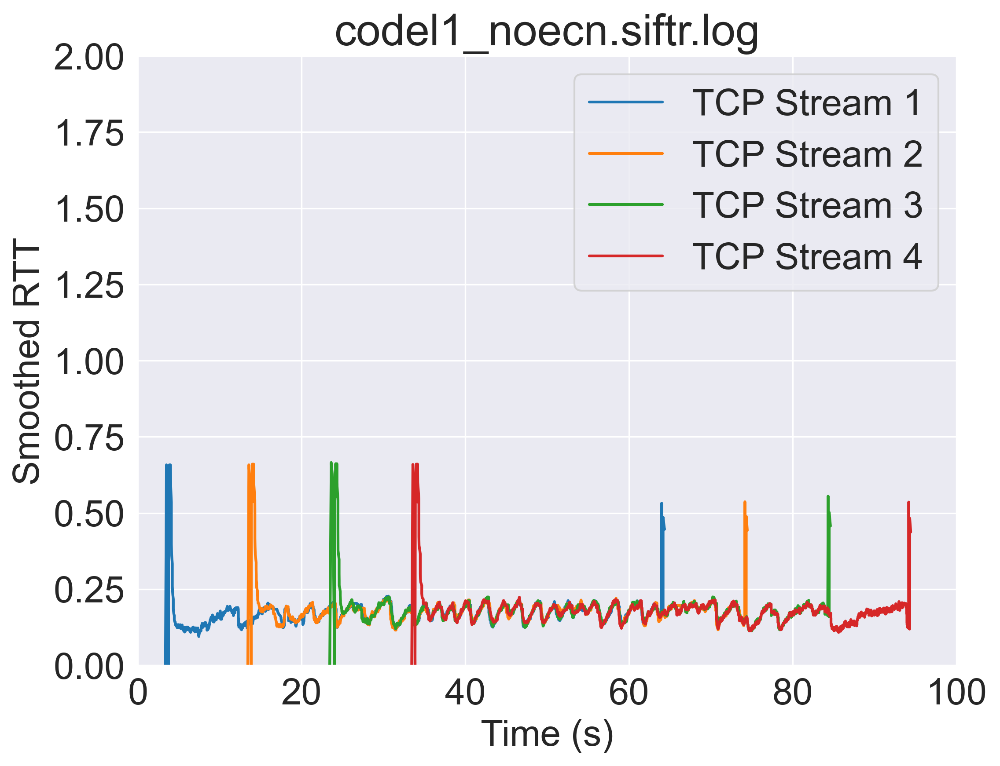

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


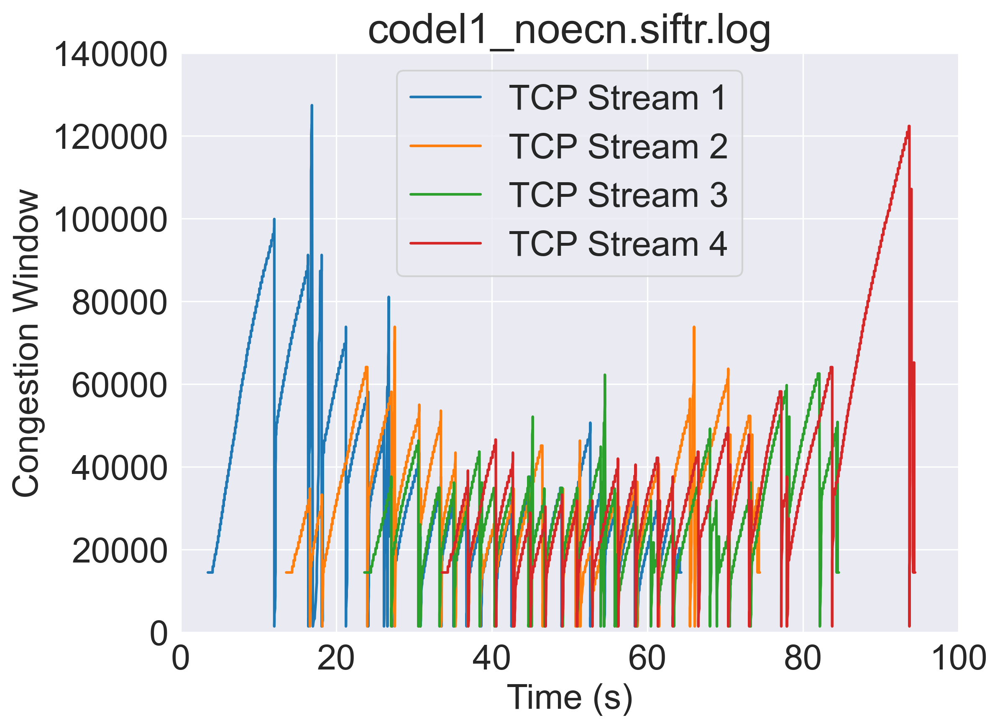

codel2_ecn.siftr.log
count    175.000000
mean       0.364395
std        0.267238
min        0.000000
25%        0.235937
50%        0.254375
75%        0.425938
max        2.849687
Name: SmoothedRTT, dtype: float64
1980    0.000000
1986    0.147813
1987    0.147813
1992    0.148125
1993    0.148125
Name: SmoothedRTT, dtype: float64
5540    0.145000
5541    0.145000
5546    0.144375
5548    0.144375
5549    0.144375
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


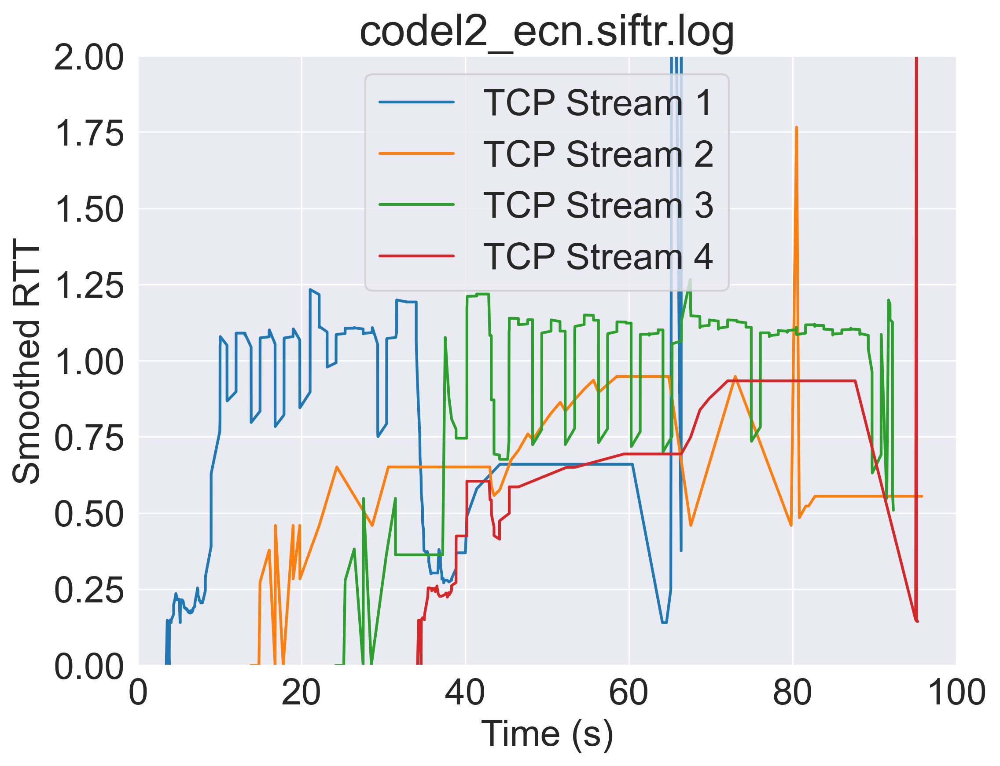

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


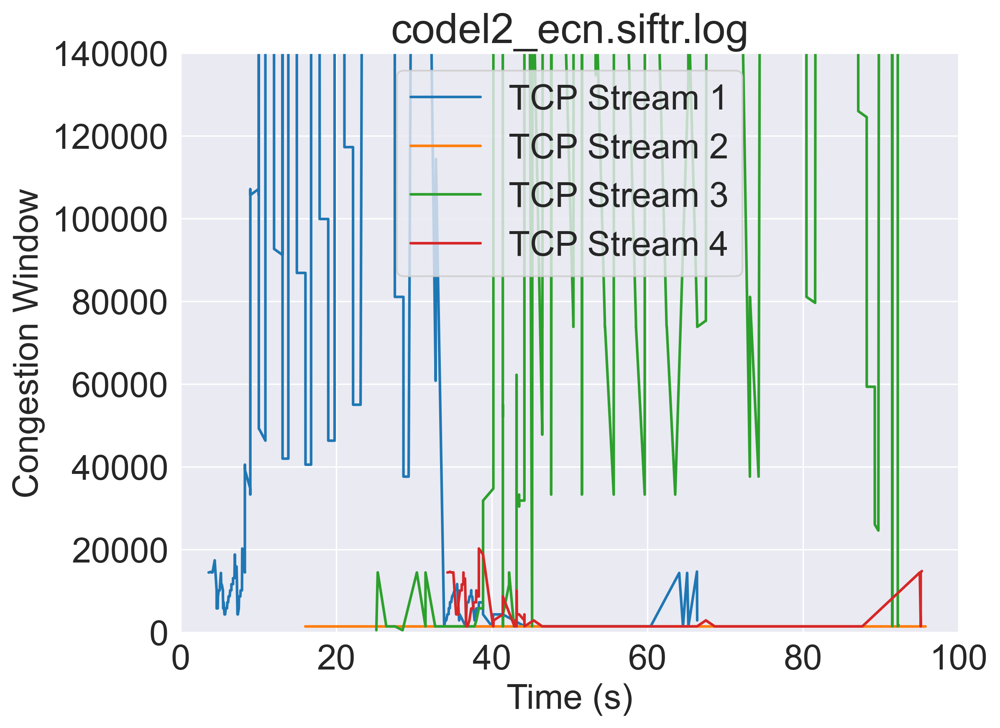

codel2_noecn.siftr.log
count    1003.000000
mean        0.966389
std         0.226733
min         0.000000
25%         0.778906
50%         0.921562
75%         1.162344
max         1.360937
Name: SmoothedRTT, dtype: float64
2164    0.000000
2223    0.338750
2224    0.338750
2286    0.411562
2287    0.411562
Name: SmoothedRTT, dtype: float64
6695    0.608750
6696    0.608750
6736    0.592812
6738    0.592812
6739    0.592812
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


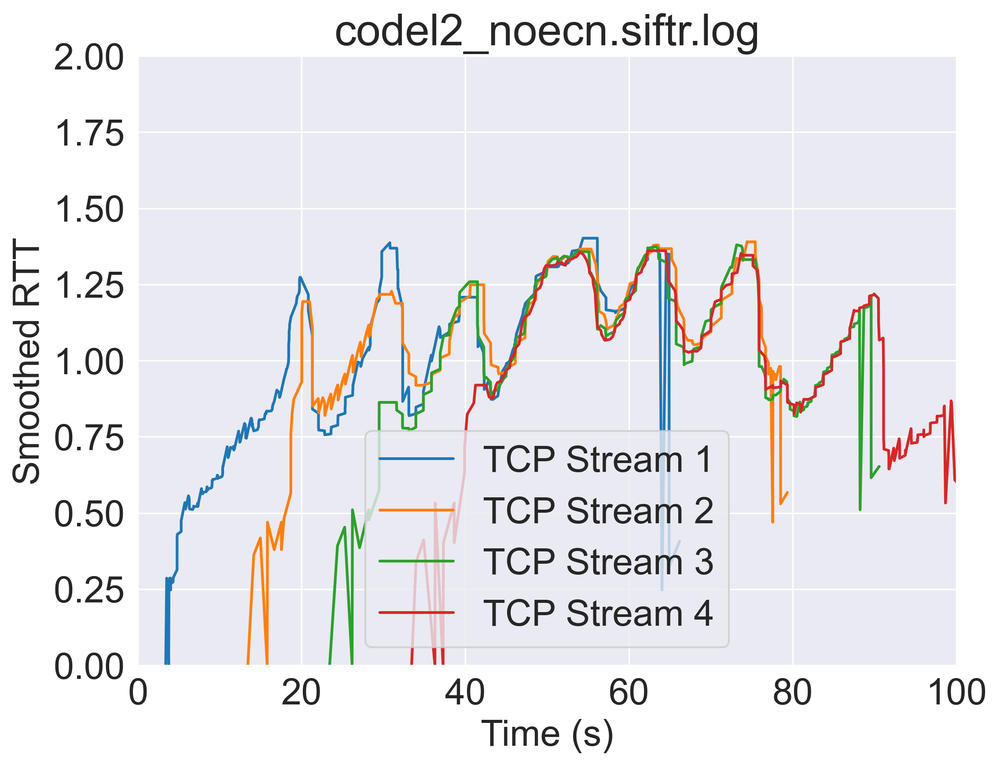

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


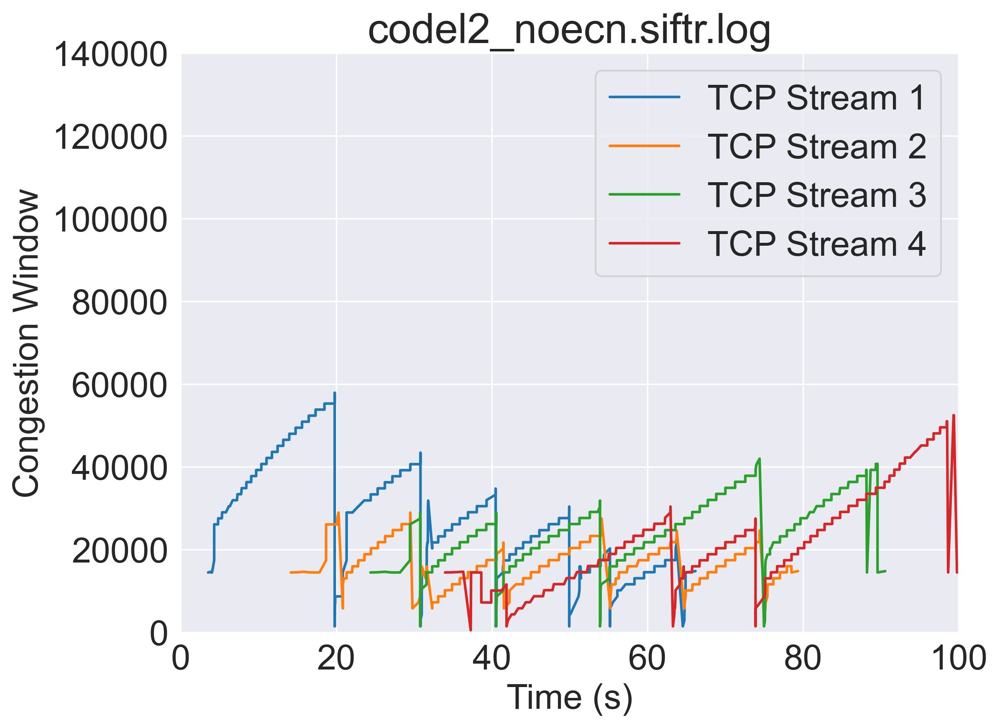

fqcodel1_ecn.siftr.log
count    8705.000000
mean        0.170187
std         0.062893
min         0.000000
25%         0.147500
50%         0.170000
75%         0.185000
max         1.285625
Name: SmoothedRTT, dtype: float64
15912    0.000000
16039    1.285625
16046    1.285625
16182    1.148750
16183    1.148750
Name: SmoothedRTT, dtype: float64
52094    0.907188
52095    0.907188
52152    0.811562
52154    0.811562
52155    0.811562
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


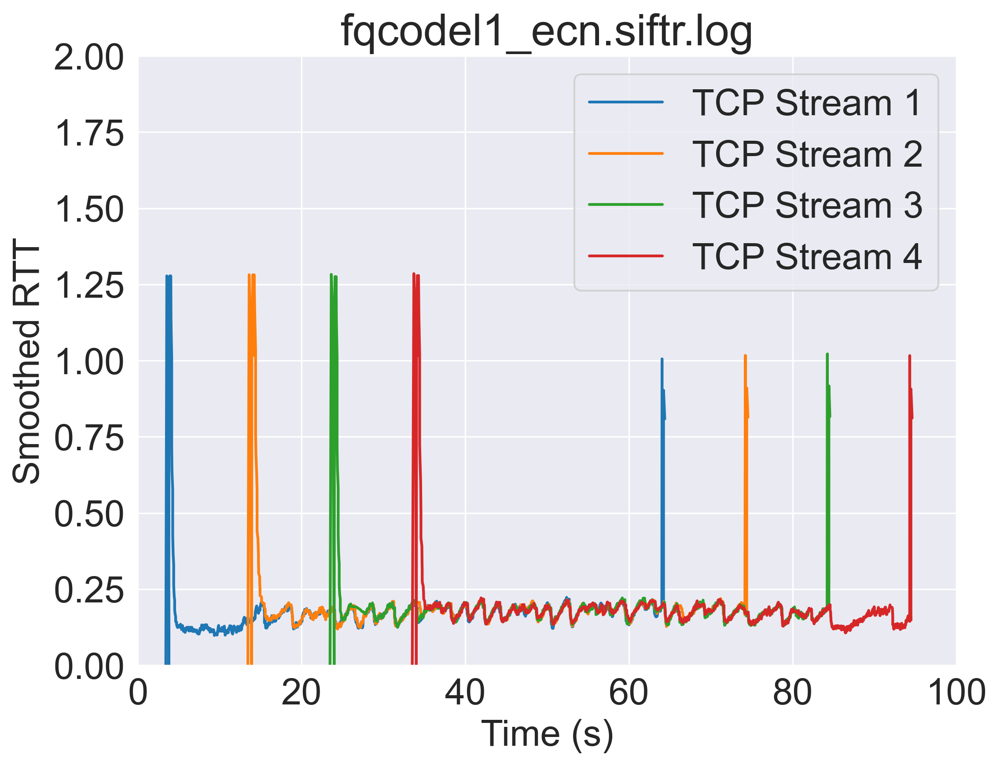

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


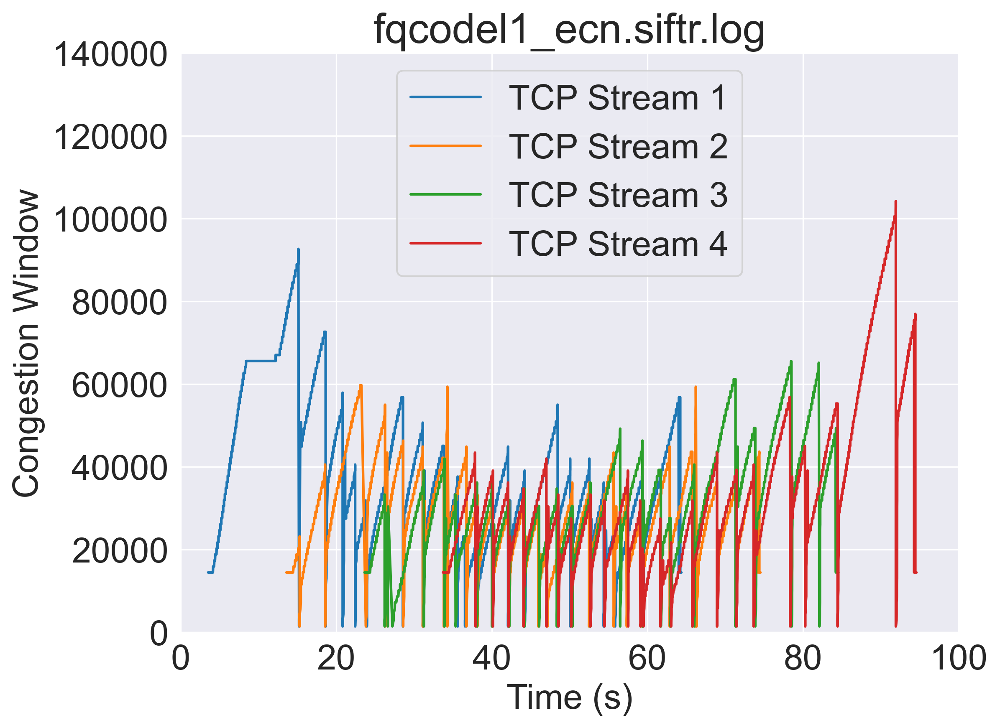

fqcodel1_noecn.siftr.log
count    8640.000000
mean        0.169390
std         0.034765
min         0.000000
25%         0.152188
50%         0.172187
75%         0.186250
max         0.620000
Name: SmoothedRTT, dtype: float64
16143    0.00000
16262    0.62000
16269    0.62000
16386    0.56625
16387    0.56625
Name: SmoothedRTT, dtype: float64
51906    0.475313
51907    0.475313
51979    0.429688
51981    0.429688
51982    0.429688
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


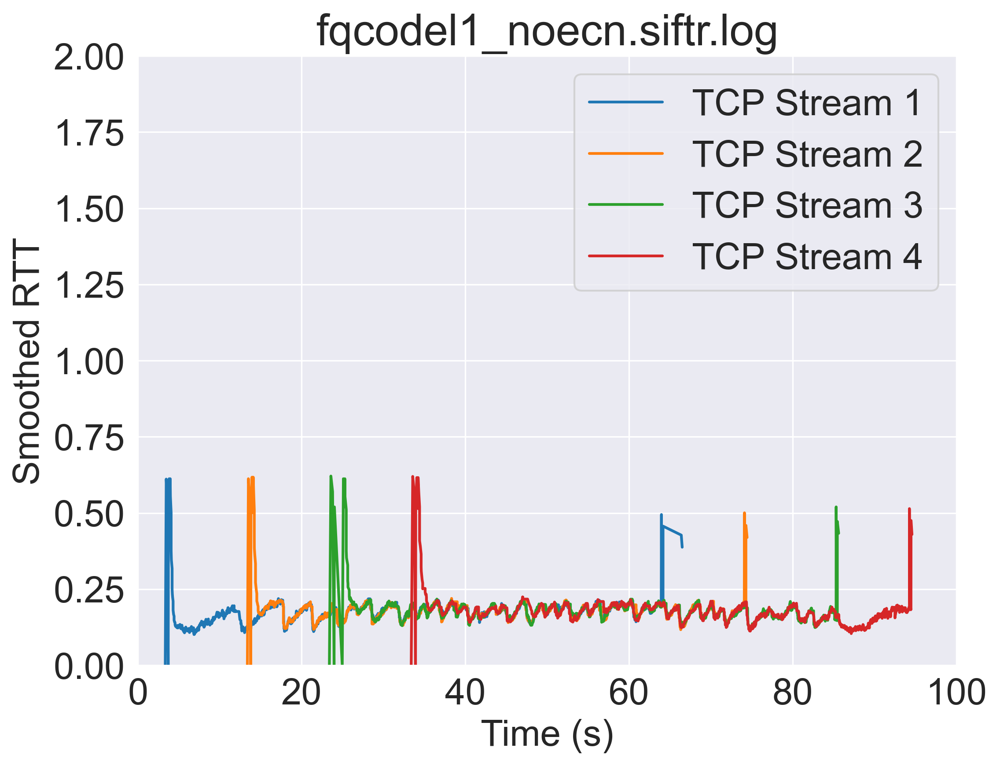

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


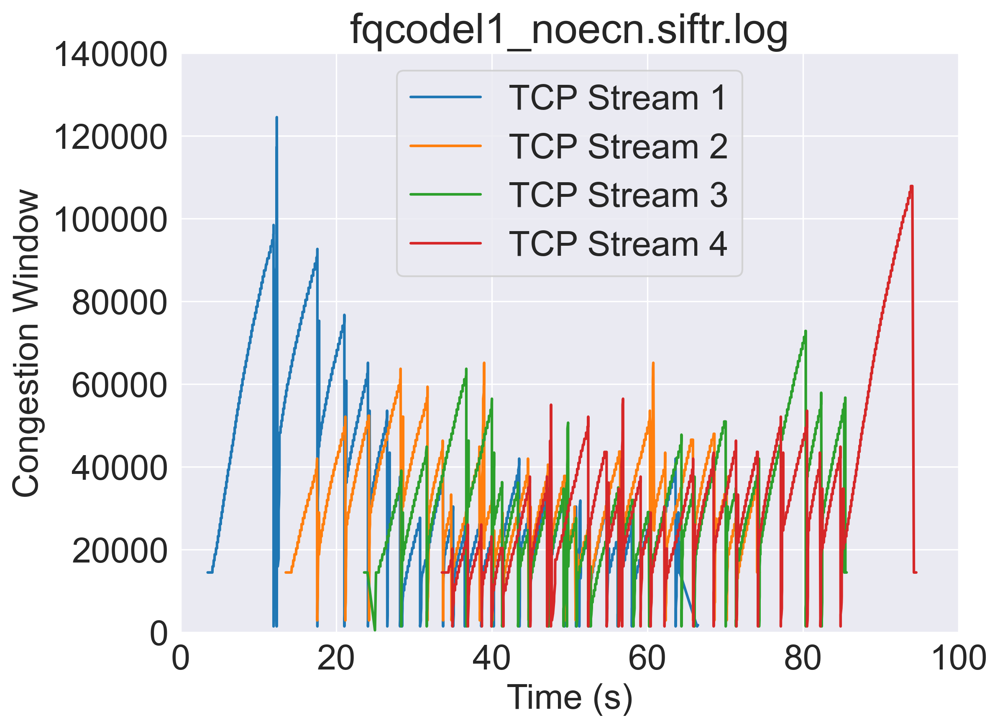

fqcodel2_ecn.siftr.log
count    968.000000
mean       0.934087
std        0.244465
min        0.000000
25%        0.735313
50%        0.865312
75%        1.094141
max        1.428750
Name: SmoothedRTT, dtype: float64
2156    0.000000
2212    0.565937
2213    0.565937
2274    0.617812
2275    0.617812
Name: SmoothedRTT, dtype: float64
6682    0.71125
6683    0.71125
6721    0.67500
6723    0.67500
6724    0.67500
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


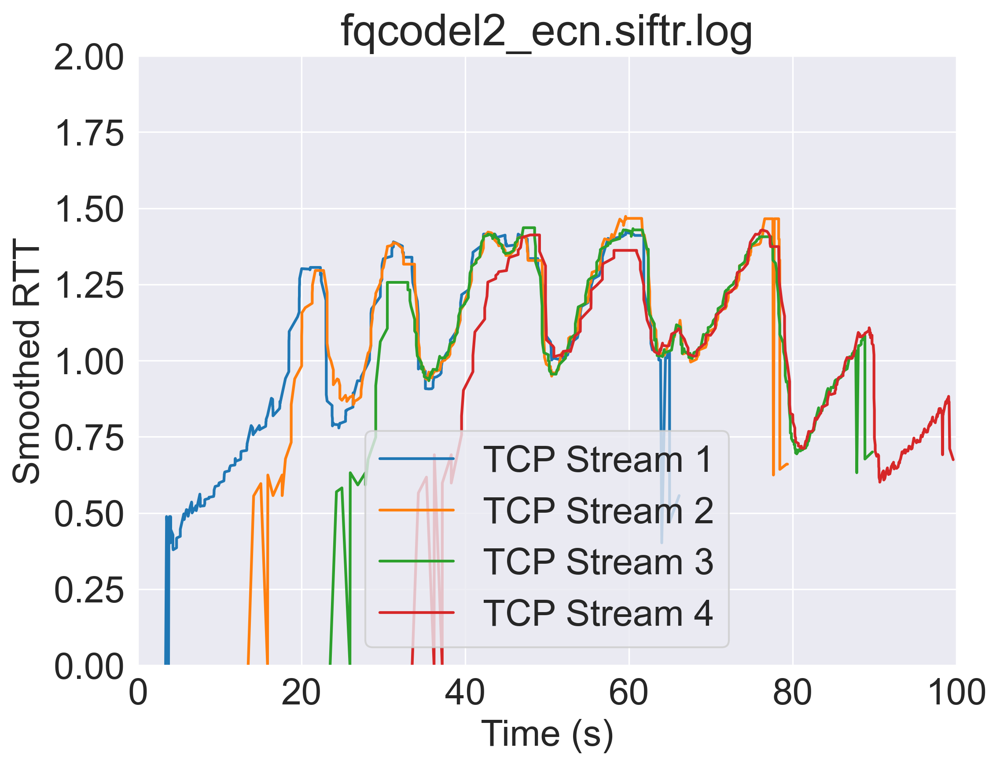

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


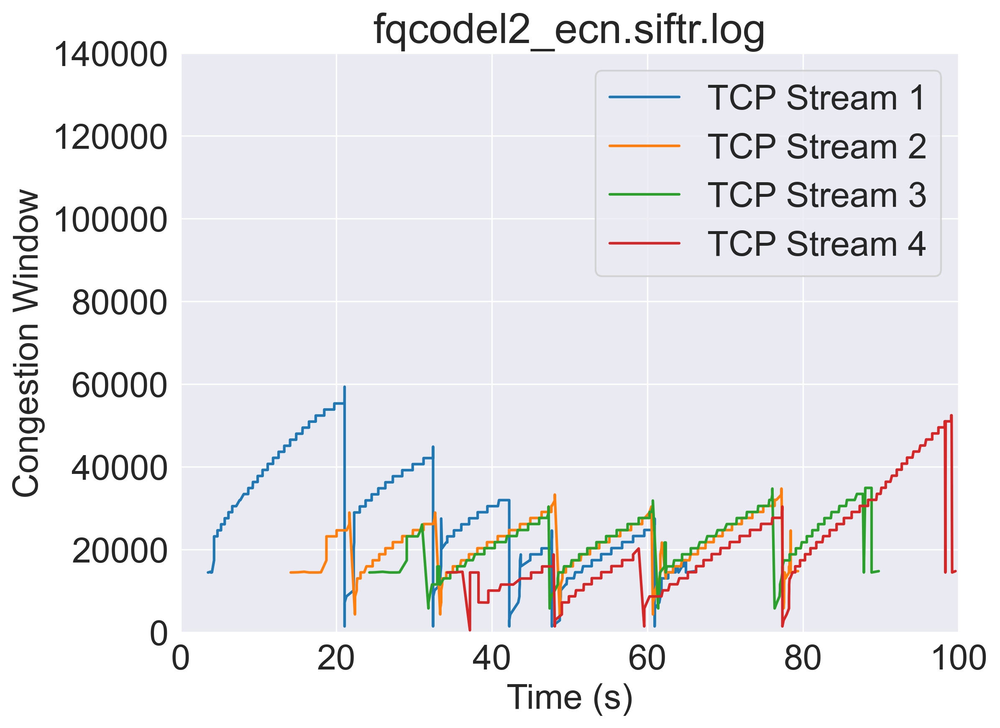

fqcodel2_noecn.siftr.log
count    956.000000
mean       0.982504
std        0.203344
min        0.000000
25%        0.825234
50%        0.940000
75%        1.150937
max        1.345625
Name: SmoothedRTT, dtype: float64
2148    0.000000
2207    0.000000
2249    0.461875
2250    0.461875
2439    0.461875
Name: SmoothedRTT, dtype: float64
6831    0.627500
6832    0.627500
6854    0.564063
6856    0.564063
6857    0.564063
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


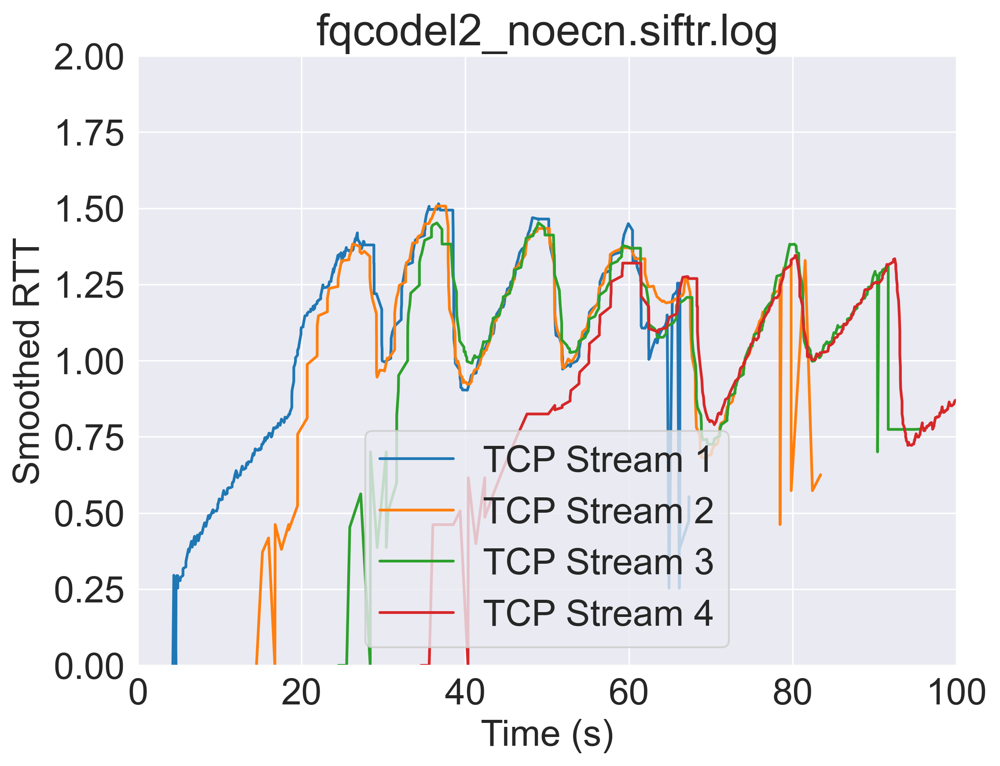

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


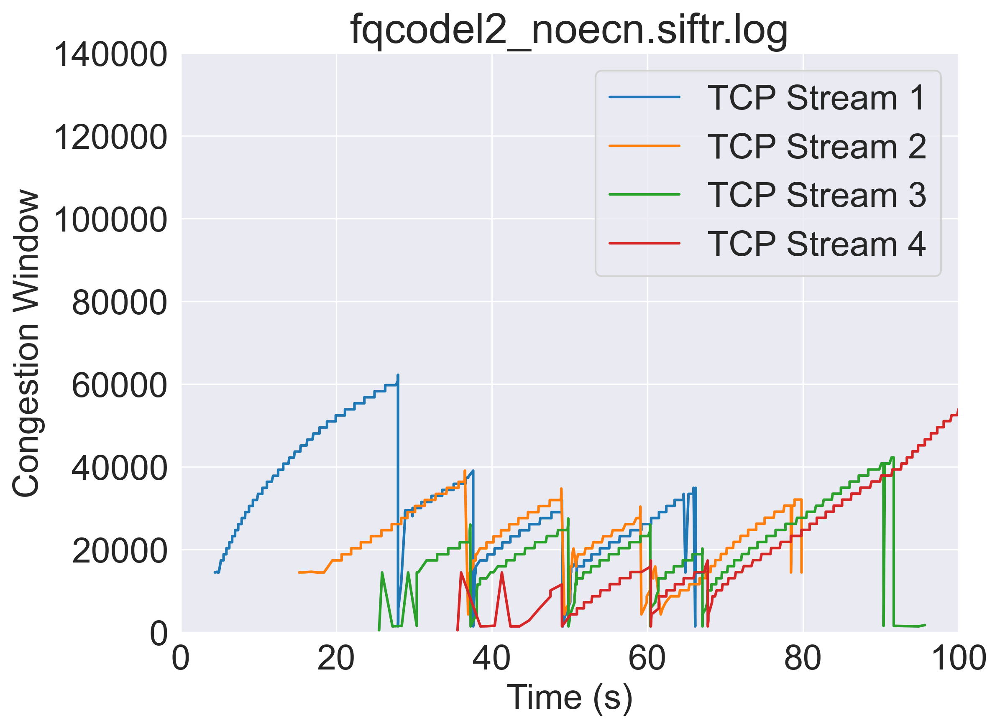

fqpie1_ecn.siftr.log
count    10366.000000
mean         0.169296
std          0.029595
min          0.000000
25%          0.152500
50%          0.170313
75%          0.184688
max          0.656563
Name: SmoothedRTT, dtype: float64
16222    0.000000
16342    0.655312
16352    0.655312
16488    0.597187
16489    0.597187
Name: SmoothedRTT, dtype: float64
55646    0.497188
55647    0.497188
55707    0.446562
55709    0.446562
55710    0.446562
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


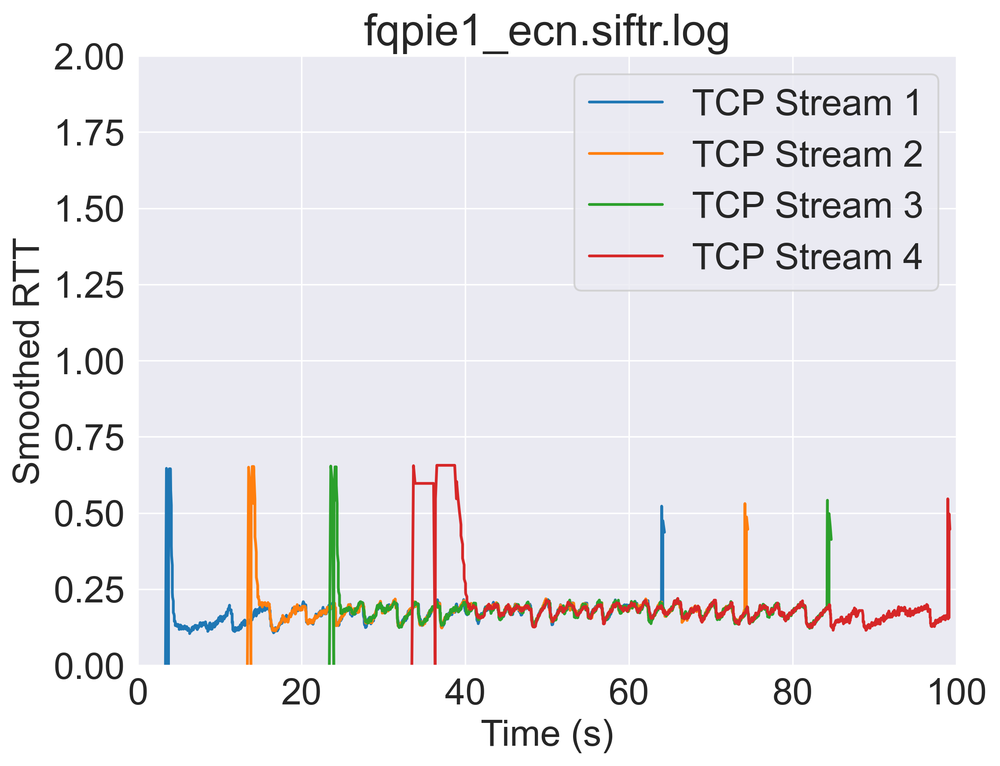

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


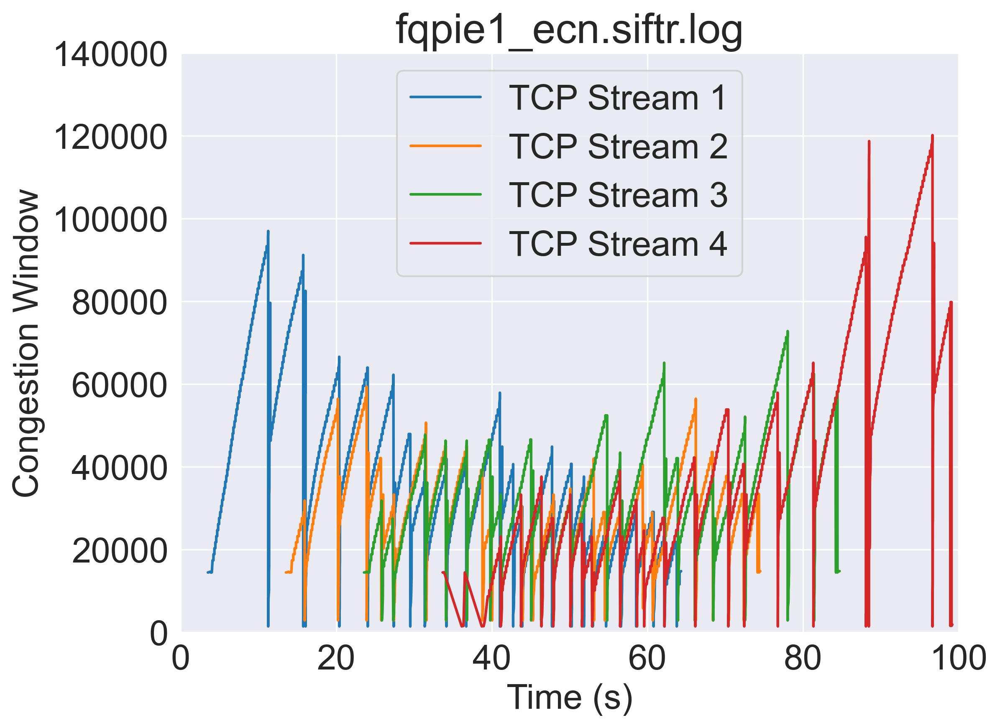

fqpie1_noecn.siftr.log
count    9229.000000
mean        0.166926
std         0.035320
min         0.000000
25%         0.146563
50%         0.166875
75%         0.185938
max         0.656250
Name: SmoothedRTT, dtype: float64
16827    0.000000
16930    0.656250
16937    0.656250
17059    0.596875
17060    0.596875
Name: SmoothedRTT, dtype: float64
52561    0.493125
52562    0.493125
52600    0.446562
52602    0.446562
52603    0.446562
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


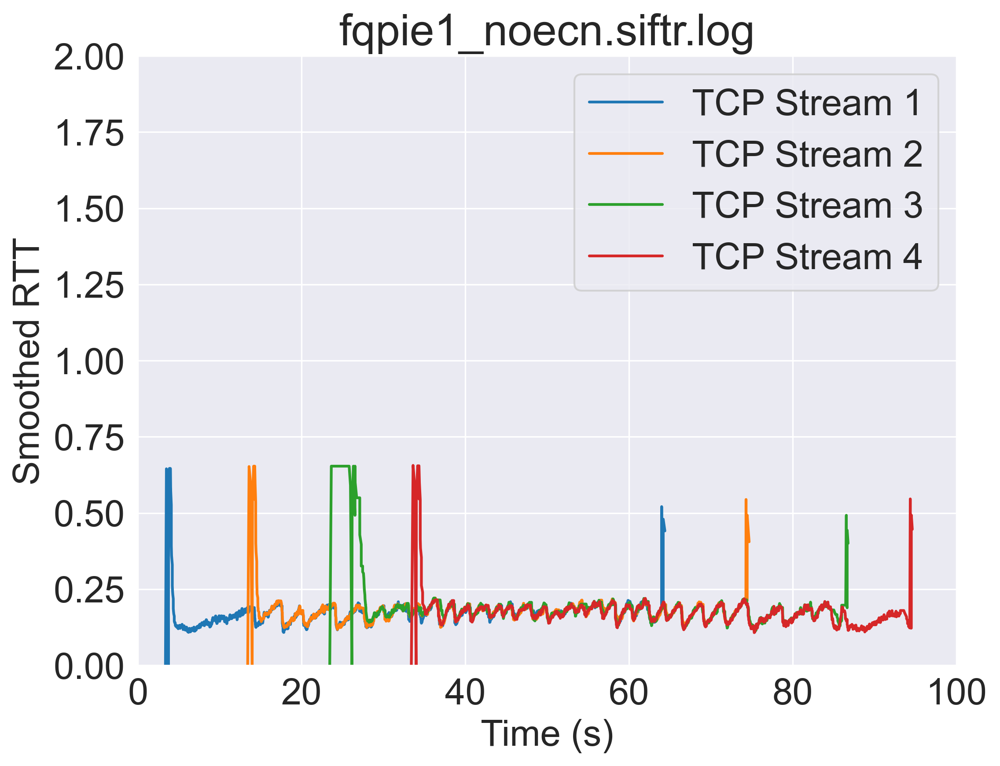

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


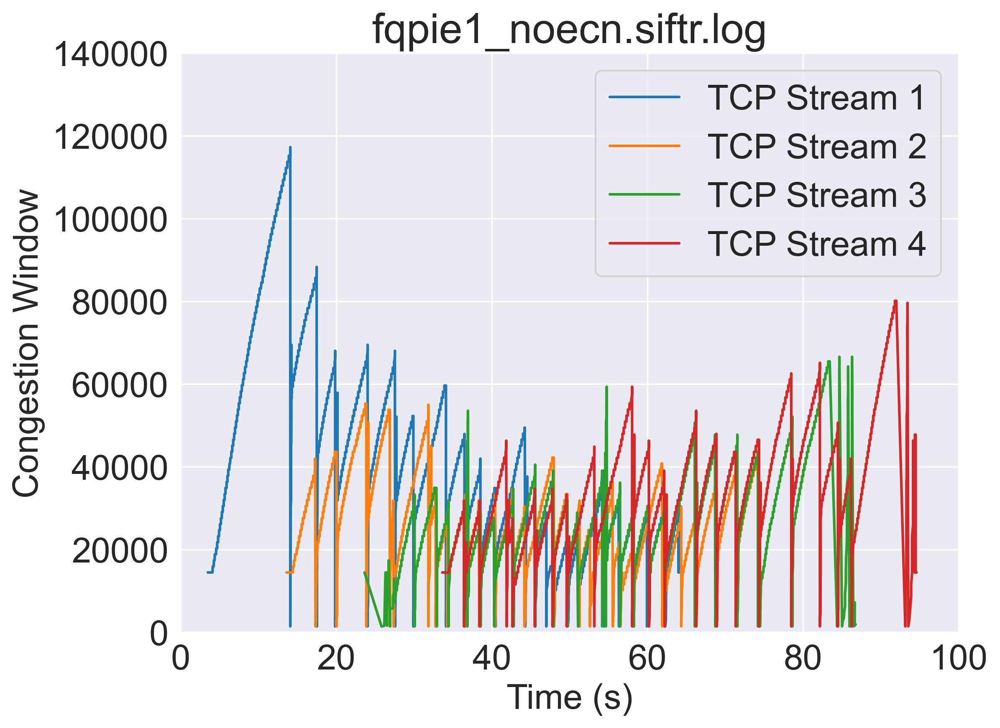

fqpie2_ecn.siftr.log
count    909.000000
mean       0.938493
std        0.252637
min        0.000000
25%        0.744687
50%        0.869375
75%        1.126562
max        1.476562
Name: SmoothedRTT, dtype: float64
2144    0.000000
2208    0.389375
2234    0.389375
2296    0.460938
2297    0.460938
Name: SmoothedRTT, dtype: float64
6707    0.566250
6708    0.566250
6749    0.551875
6751    0.551875
6752    0.551875
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


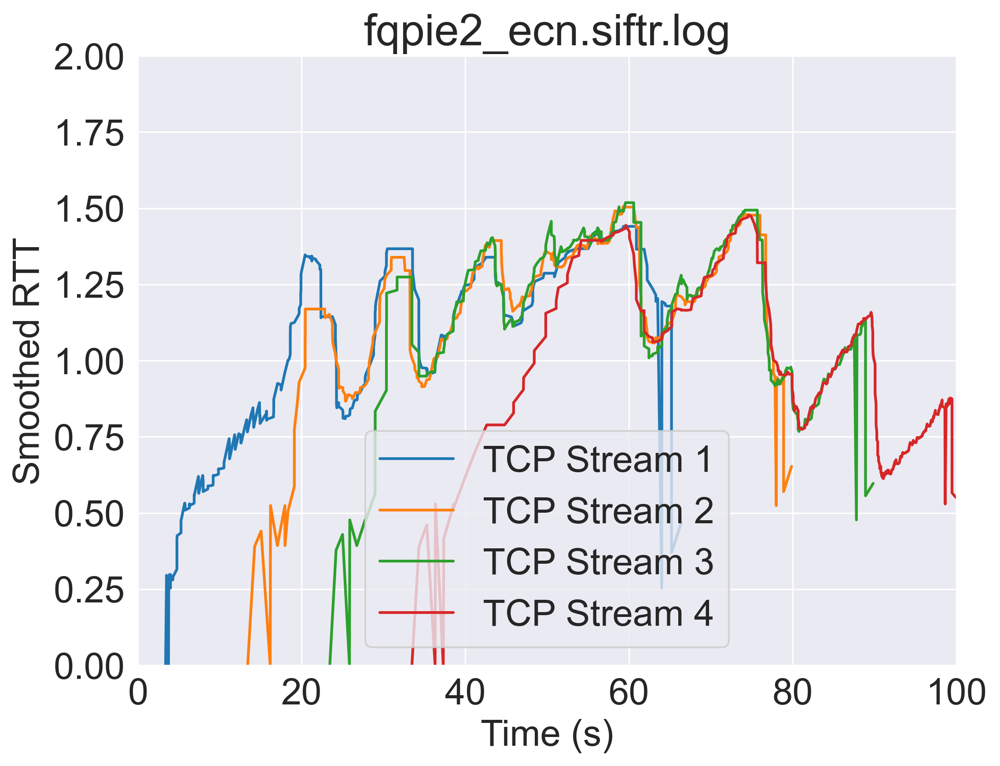

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


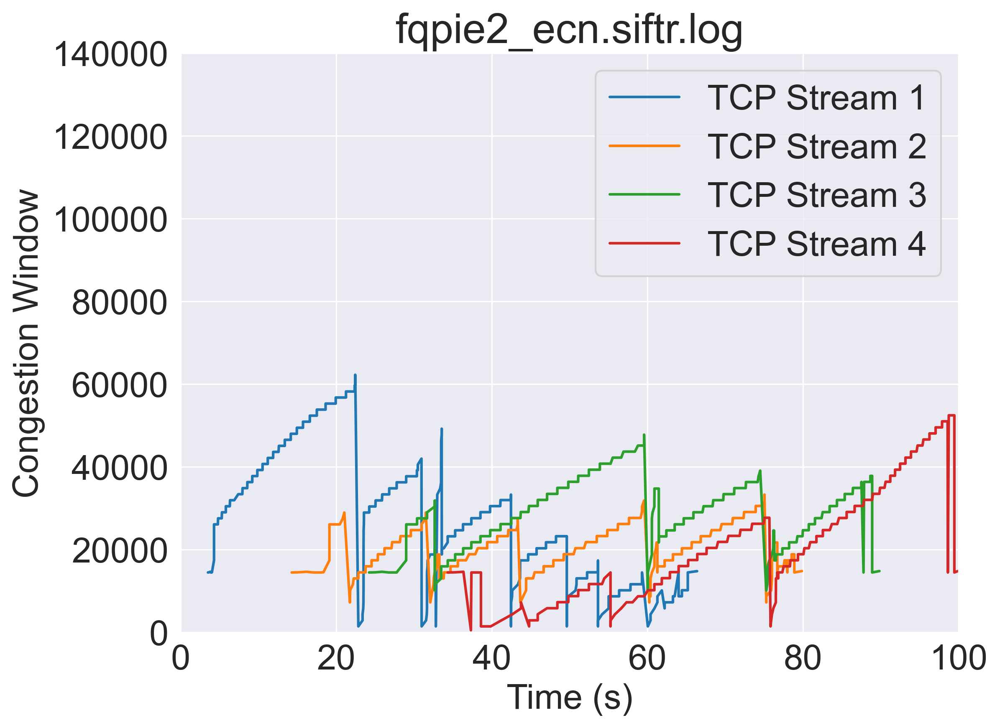

fqpie2_noecn.siftr.log
count    1054.000000
mean        0.976651
std         0.320311
min         0.000000
25%         0.637813
50%         1.072500
75%         1.265000
max         1.389687
Name: SmoothedRTT, dtype: float64
2147    0.000000
2215    0.000000
2233    0.408438
2234    0.408438
2304    0.476250
Name: SmoothedRTT, dtype: float64
6746    0.662813
6747    0.662813
6779    0.603750
6781    0.603750
6782    0.603750
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


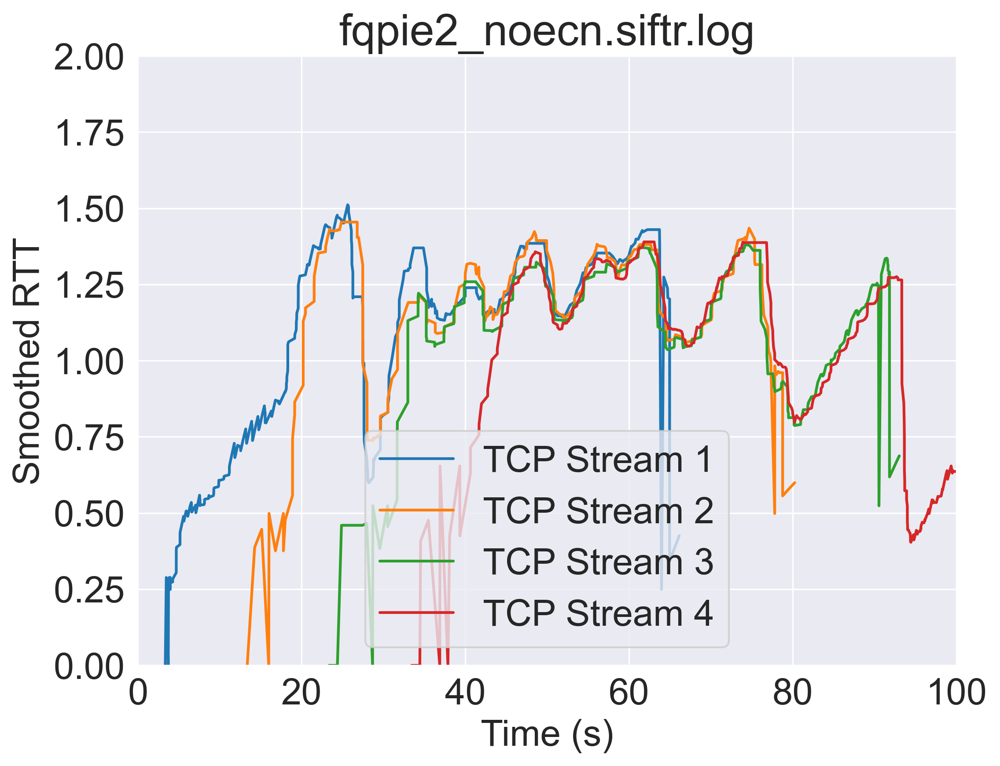

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


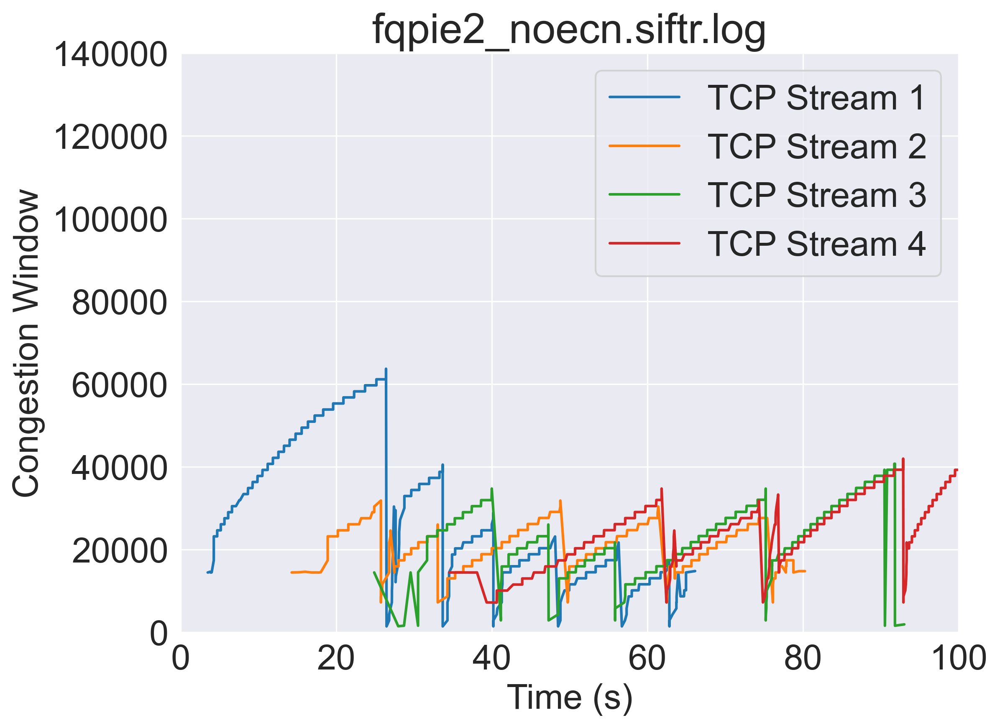

l4s1_ecn.siftr.log
count    10676.000000
mean         0.158937
std          0.039593
min          0.000000
25%          0.127109
50%          0.149531
75%          0.180000
max          0.368125
Name: SmoothedRTT, dtype: float64
15900    0.00000
16015    0.19125
16020    0.19125
16222    0.21125
16223    0.21125
Name: SmoothedRTT, dtype: float64
53143    0.188750
53200    0.180312
53211    0.180312
53212    0.180312
53229    0.171563
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


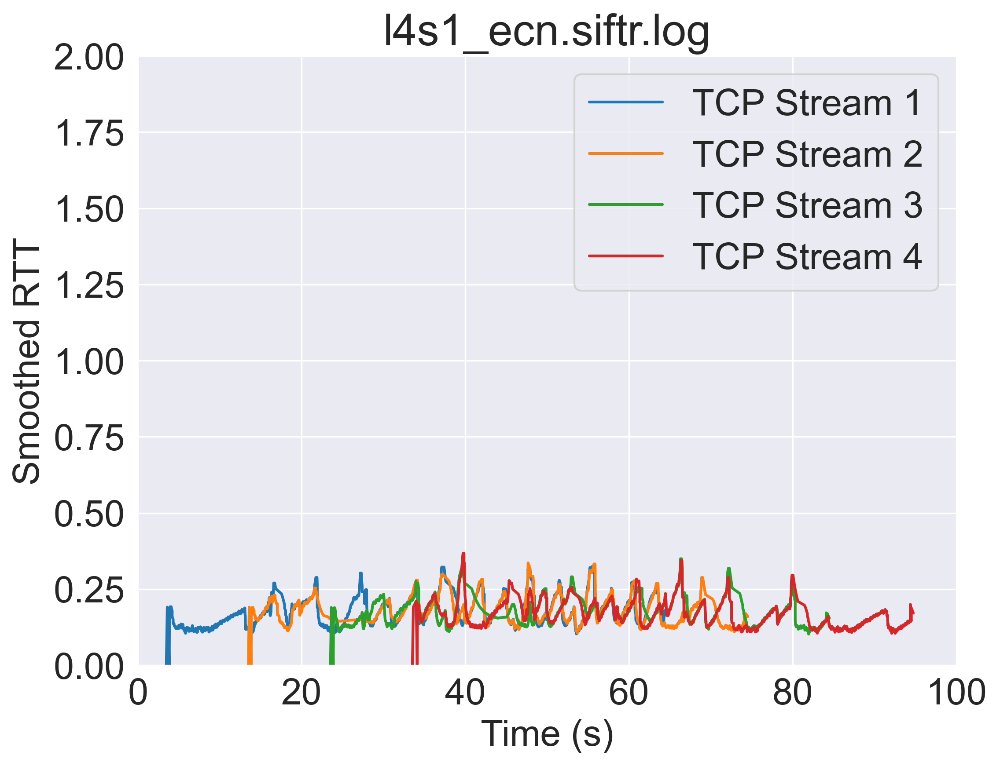

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


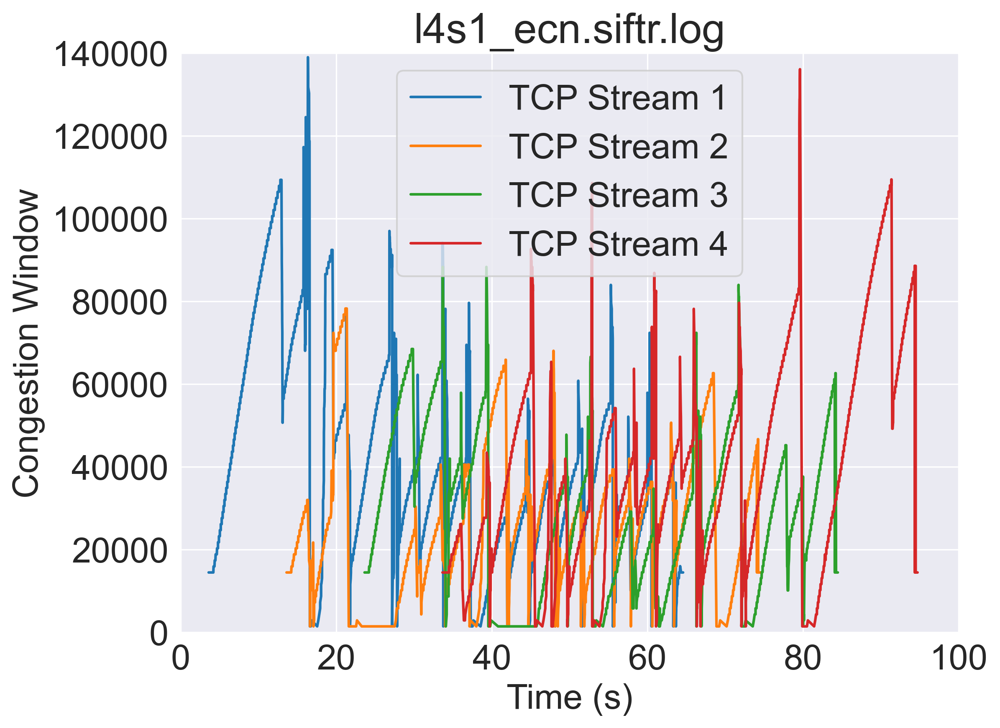

l4s1_noecn.siftr.log
count    10840.000000
mean         0.155350
std          0.031101
min          0.000000
25%          0.130625
50%          0.149375
75%          0.175000
max          0.250312
Name: SmoothedRTT, dtype: float64
17732    0.000000
17812    0.193438
17813    0.193438
17987    0.203125
17988    0.203125
Name: SmoothedRTT, dtype: float64
56930    0.192500
56981    0.182188
56991    0.182188
56992    0.182188
57020    0.174687
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


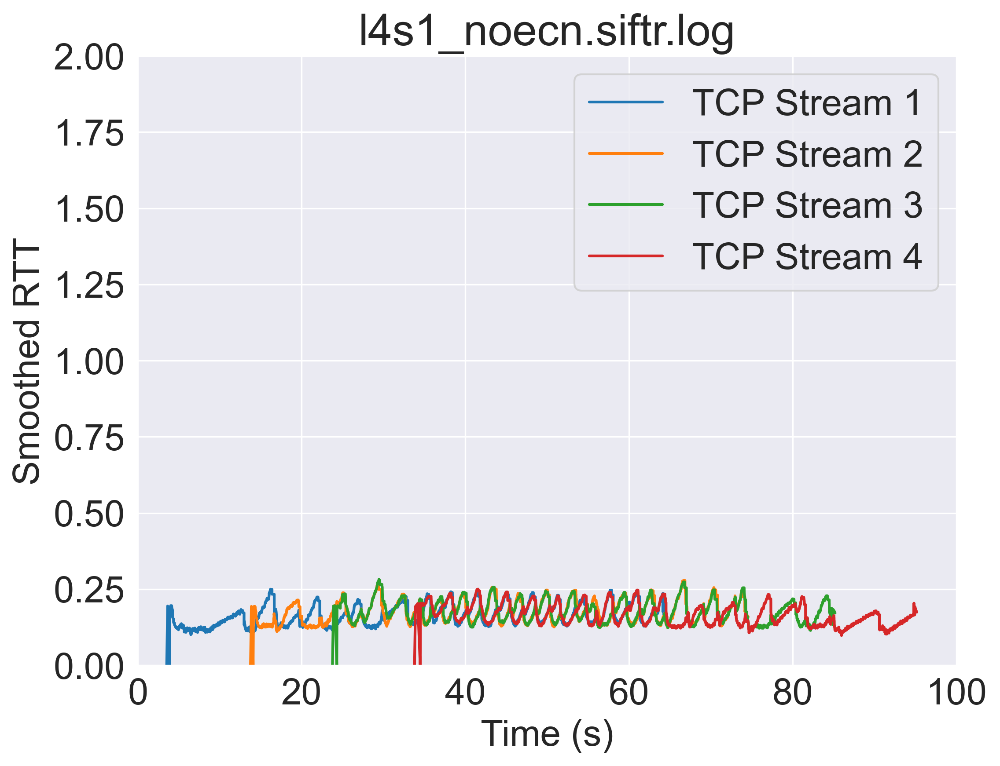

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


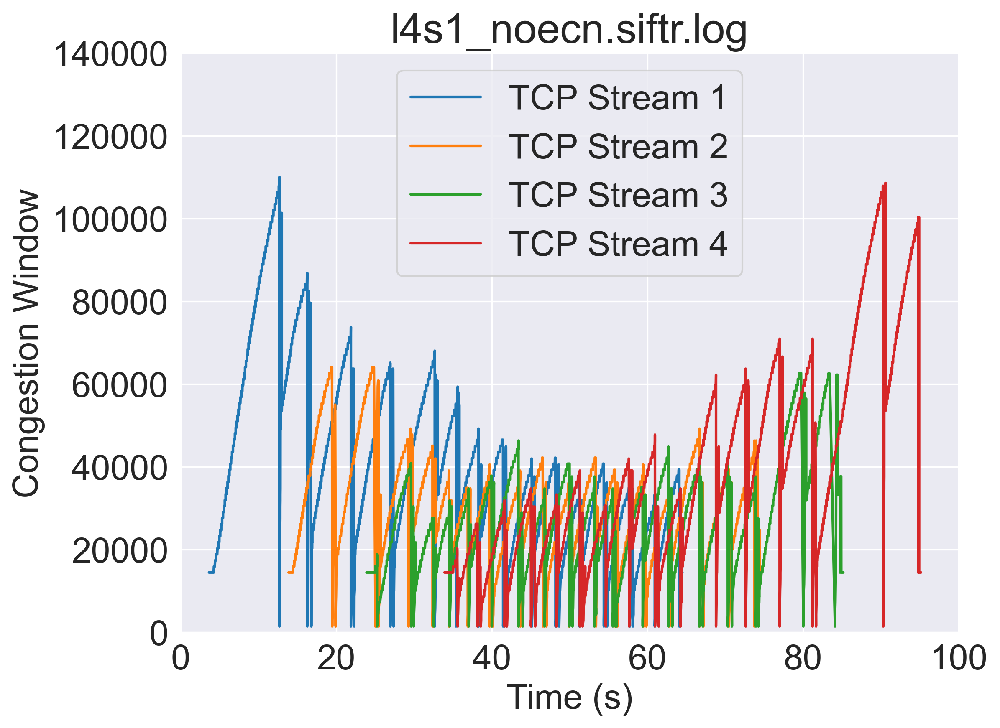

l4s2_ecn.siftr.log
count    1129.000000
mean        0.280163
std         0.057072
min         0.000000
25%         0.240313
50%         0.278750
75%         0.311875
max         0.425000
Name: SmoothedRTT, dtype: float64
2323    0.000000
2339    0.152812
2342    0.152812
2371    0.182500
2372    0.182500
Name: SmoothedRTT, dtype: float64
6912    0.171563
6913    0.171563
6925    0.169063
6927    0.169063
6928    0.169063
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


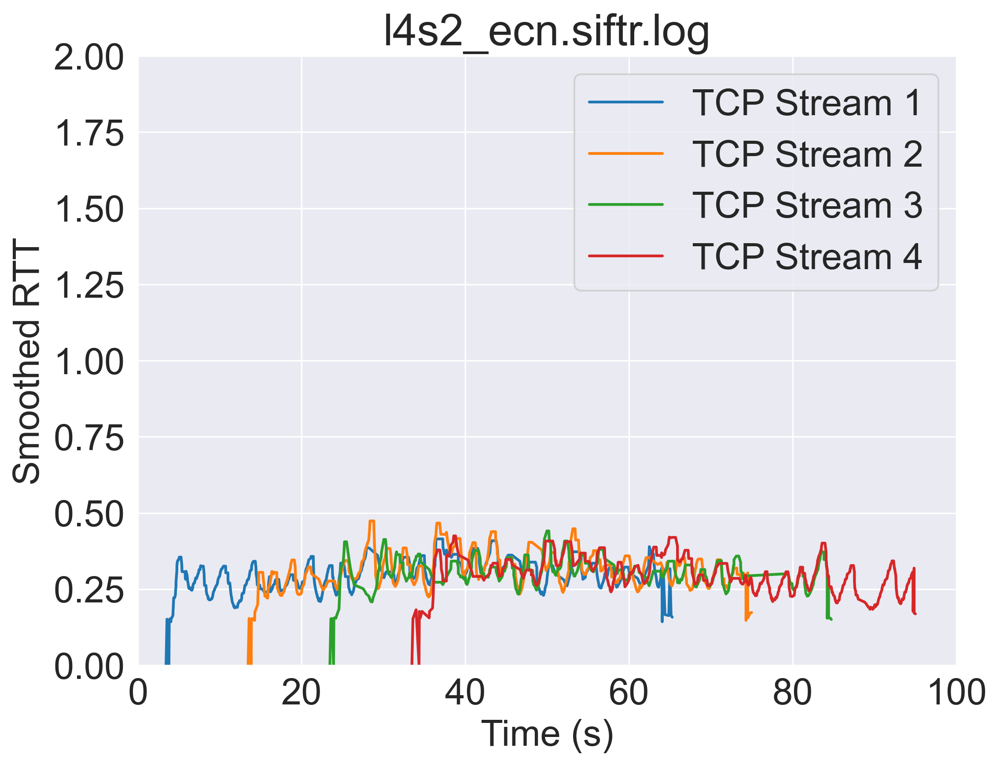

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


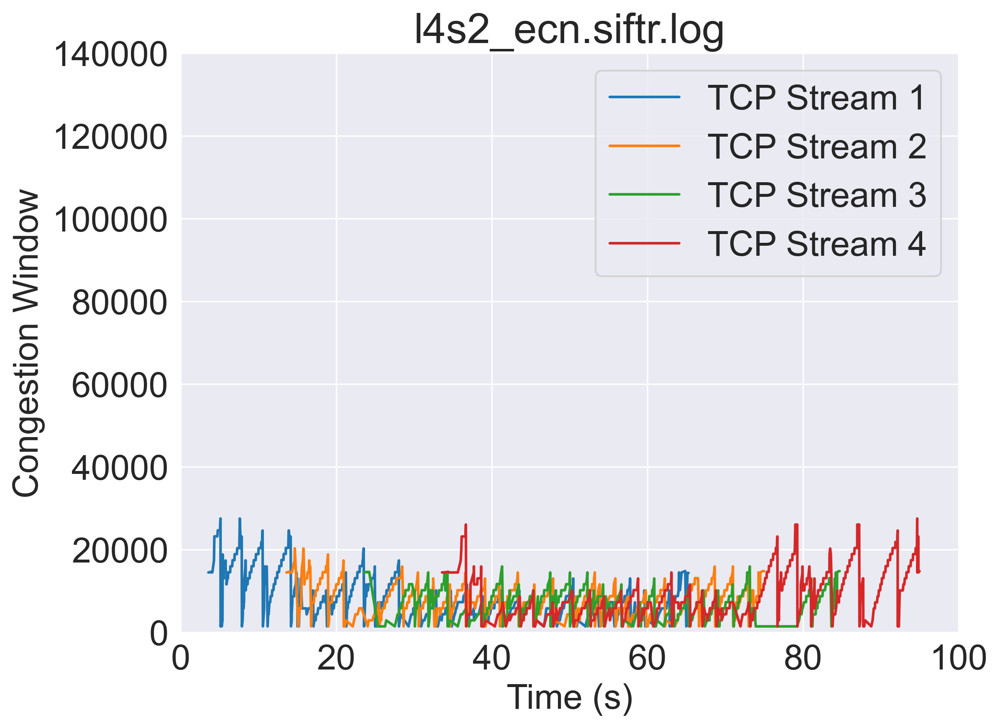

l4s2_noecn.siftr.log
count    928.000000
mean       0.297188
std        0.068593
min        0.000000
25%        0.245625
50%        0.299375
75%        0.344062
max        0.472813
Name: SmoothedRTT, dtype: float64
2423    0.000000
2437    0.163125
2438    0.163125
2479    0.163125
2529    0.219062
Name: SmoothedRTT, dtype: float64
7010    0.198437
7024    0.195000
7026    0.195000
7027    0.195000
7039    0.184375
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


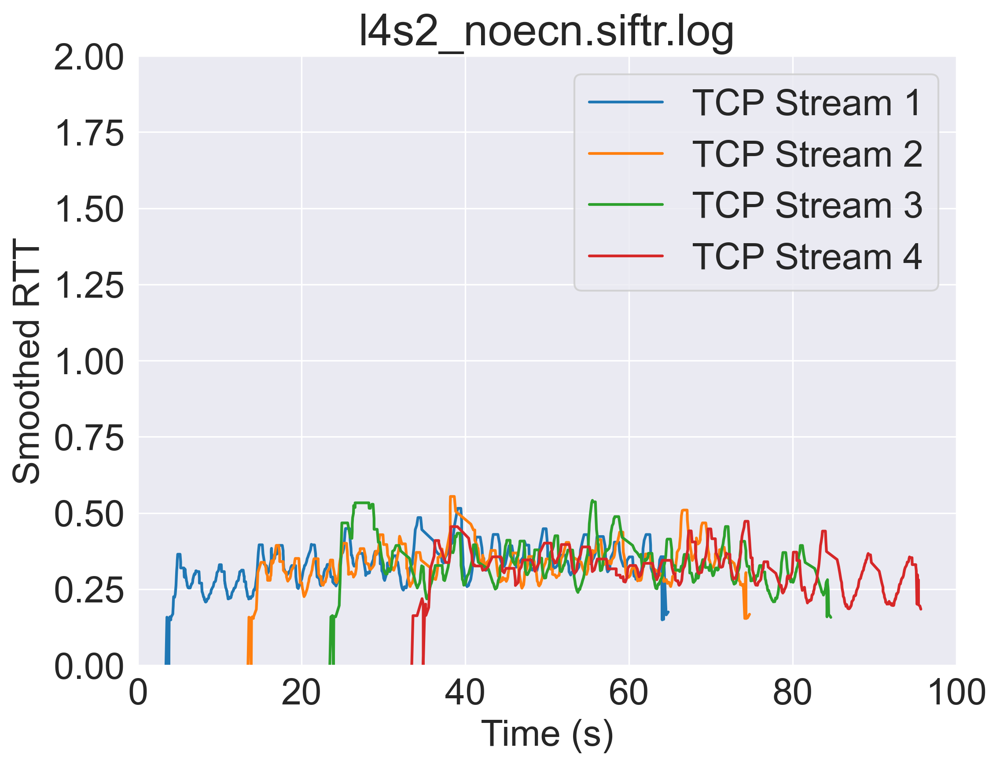

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


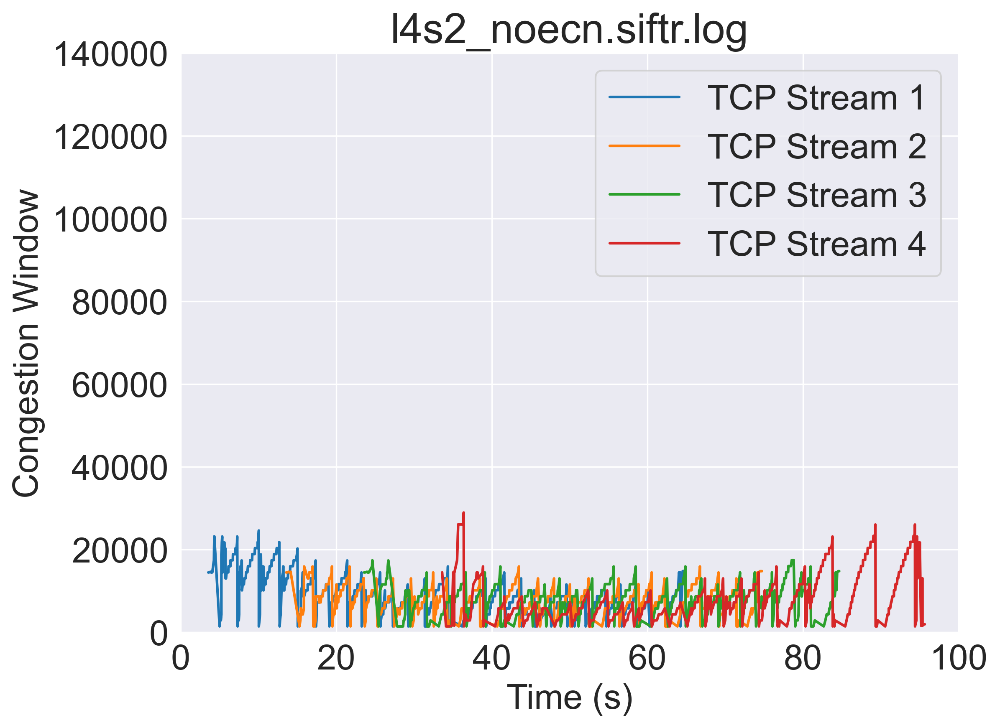

pie1_ecn.siftr.log
count    9704.000000
mean        0.164191
std         0.035098
min         0.000000
25%         0.140625
50%         0.164375
75%         0.184375
max         0.597187
Name: SmoothedRTT, dtype: float64
16134    0.000000
16233    0.595938
16255    0.595938
16360    0.541562
16361    0.541562
Name: SmoothedRTT, dtype: float64
53087    0.455937
53088    0.455937
53158    0.419063
53160    0.419063
53161    0.419063
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


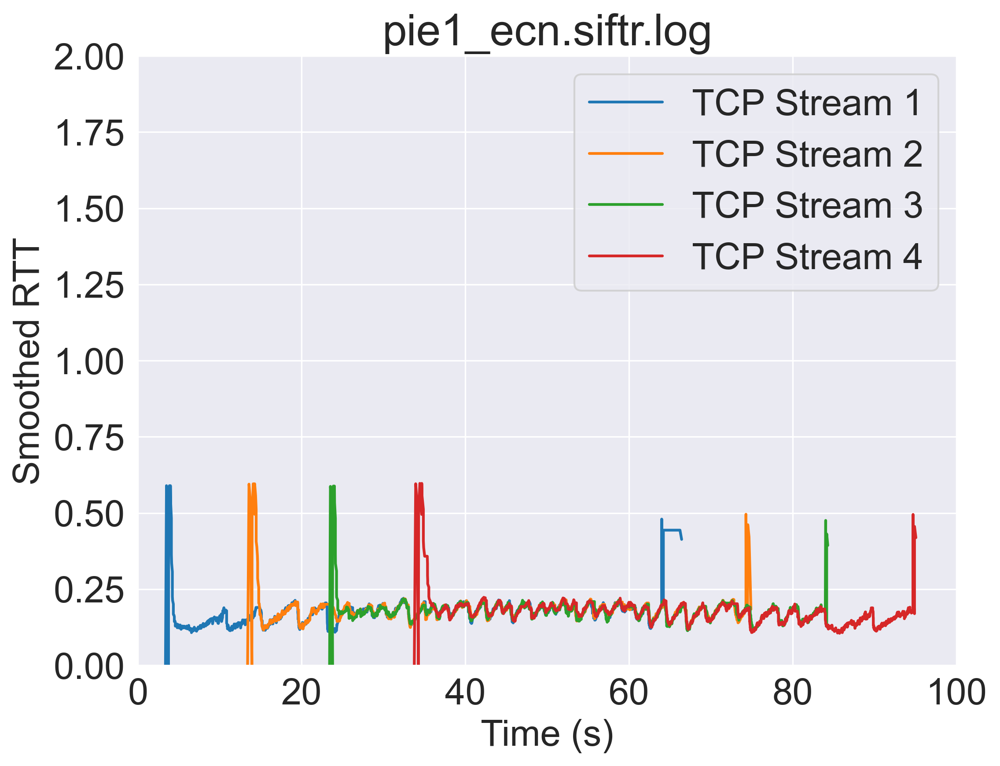

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


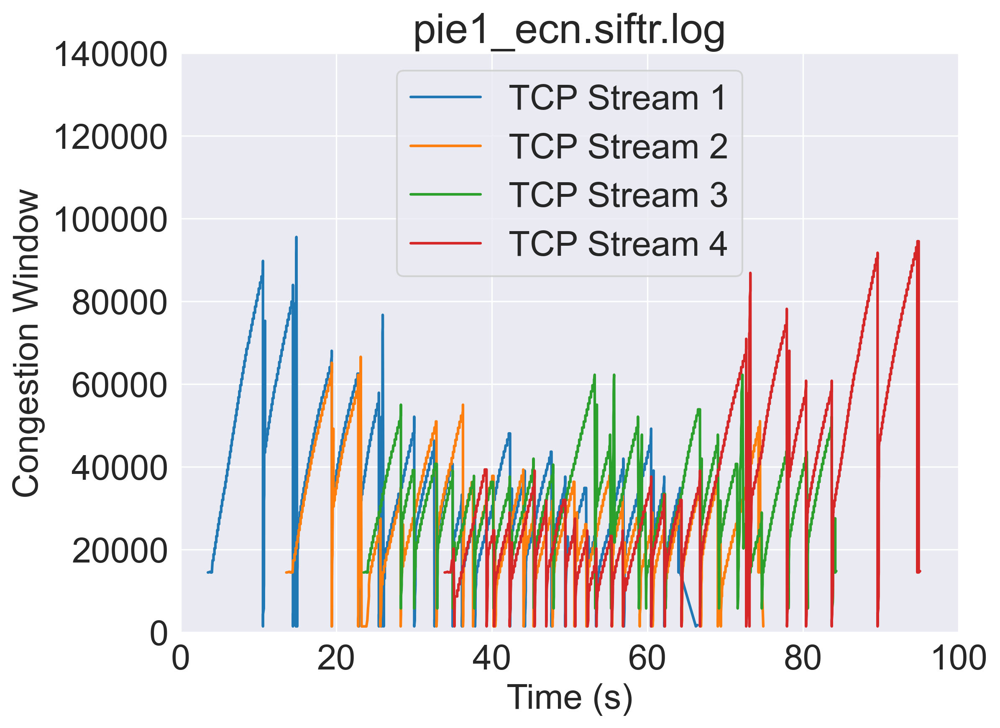

pie1_noecn.siftr.log
count    9117.000000
mean        0.163398
std         0.034371
min         0.000000
25%         0.140000
50%         0.165000
75%         0.181562
max         0.579063
Name: SmoothedRTT, dtype: float64
15732    0.000000
15853    0.579063
15863    0.579063
17201    0.579063
17330    0.531875
Name: SmoothedRTT, dtype: float64
53920    0.406562
53921    0.406562
53971    0.369688
53973    0.369688
53974    0.369688
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


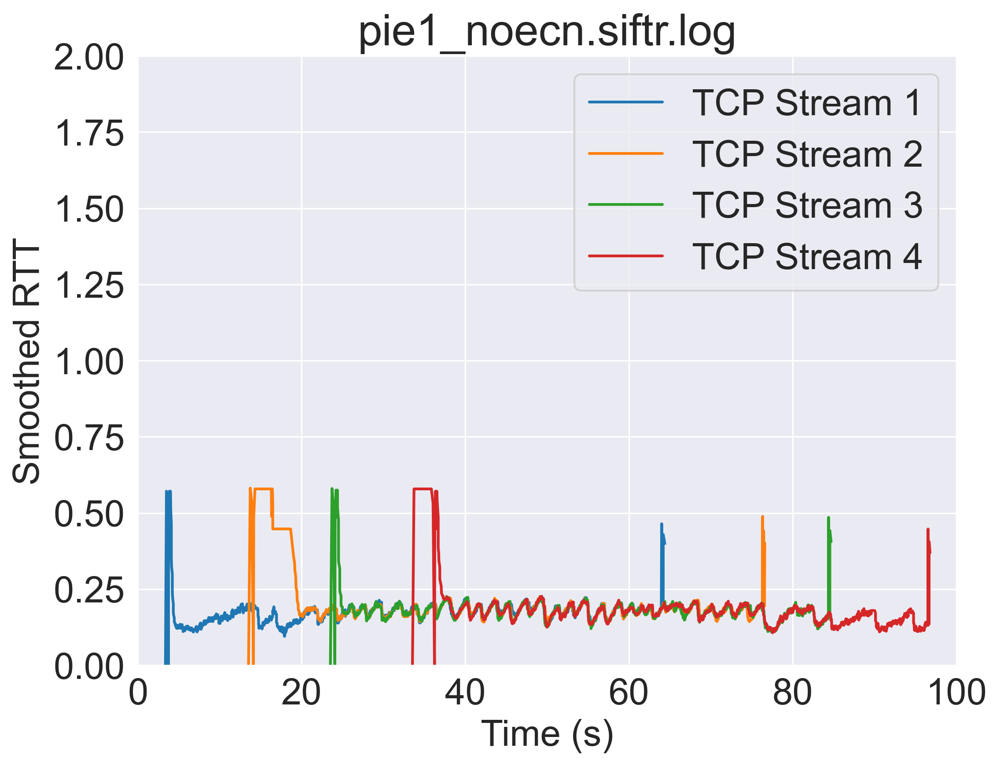

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


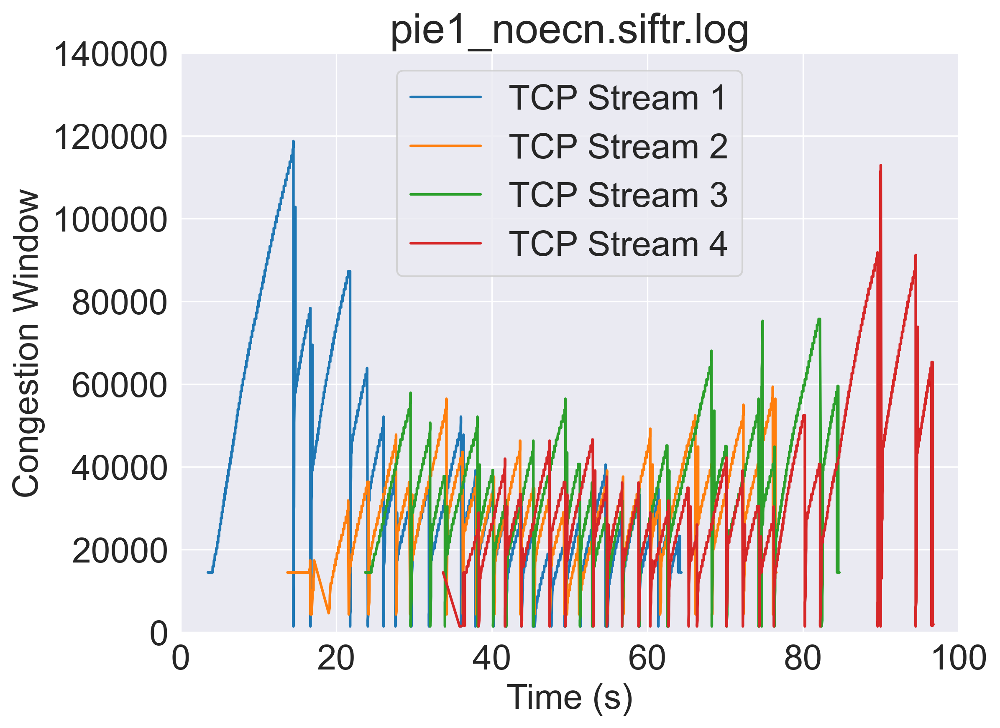

pie2_ecn.siftr.log
count    934.000000
mean       0.963478
std        0.211460
min        0.000000
25%        0.829141
50%        0.912344
75%        1.079375
max        1.477500
Name: SmoothedRTT, dtype: float64
2125    0.00000
2198    0.00000
2218    0.41125
2219    0.41125
2301    0.52125
Name: SmoothedRTT, dtype: float64
6698    0.684688
6699    0.684688
6744    0.651875
6746    0.651875
6747    0.651875
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


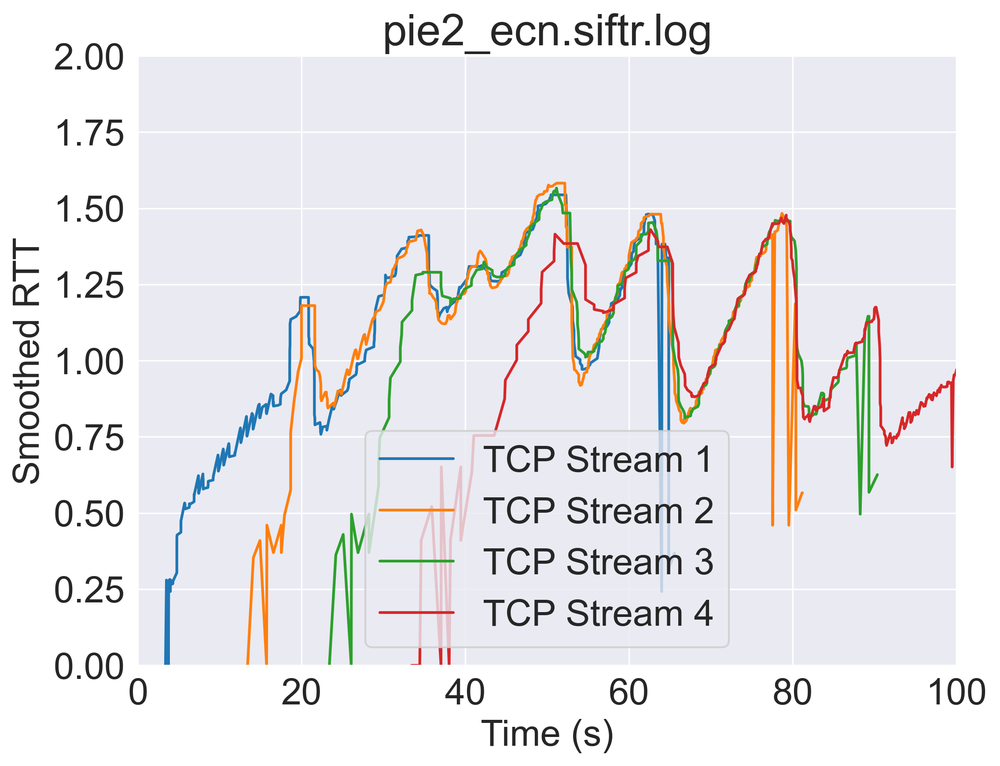

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


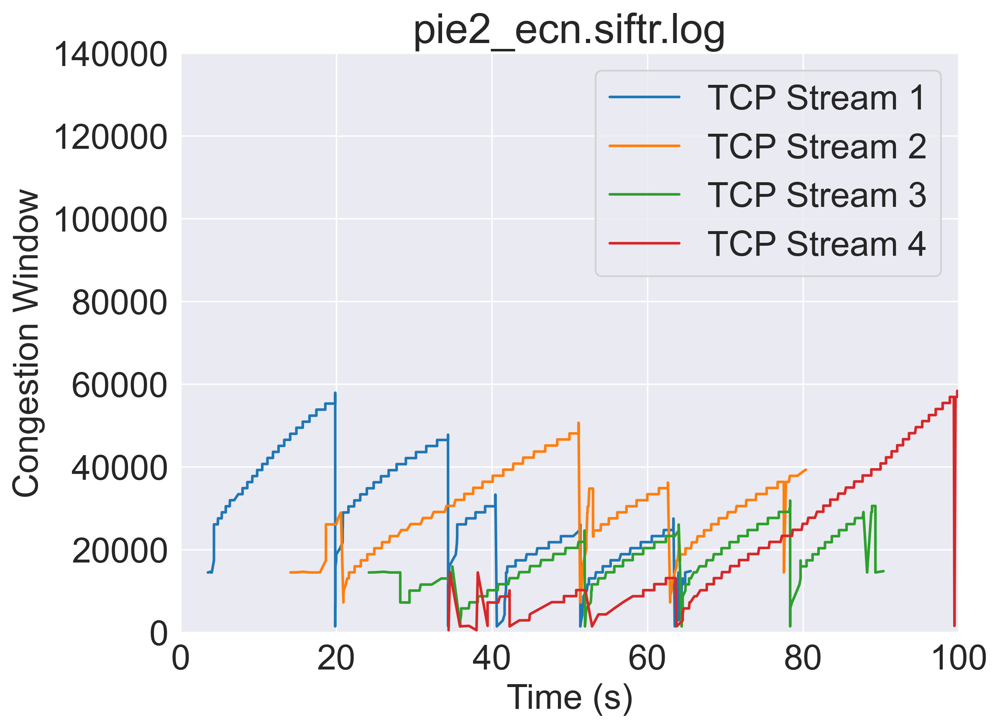

pie2_noecn.siftr.log
count    978.000000
mean       0.912044
std        0.278099
min        0.000000
25%        0.671563
50%        0.809375
75%        1.150625
max        1.505625
Name: SmoothedRTT, dtype: float64
2190    0.0000
2266    0.0000
2268    0.4100
2269    0.4100
2351    0.5175
Name: SmoothedRTT, dtype: float64
6745    0.652188
6746    0.652188
6773    0.633437
6775    0.633437
6776    0.633437
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


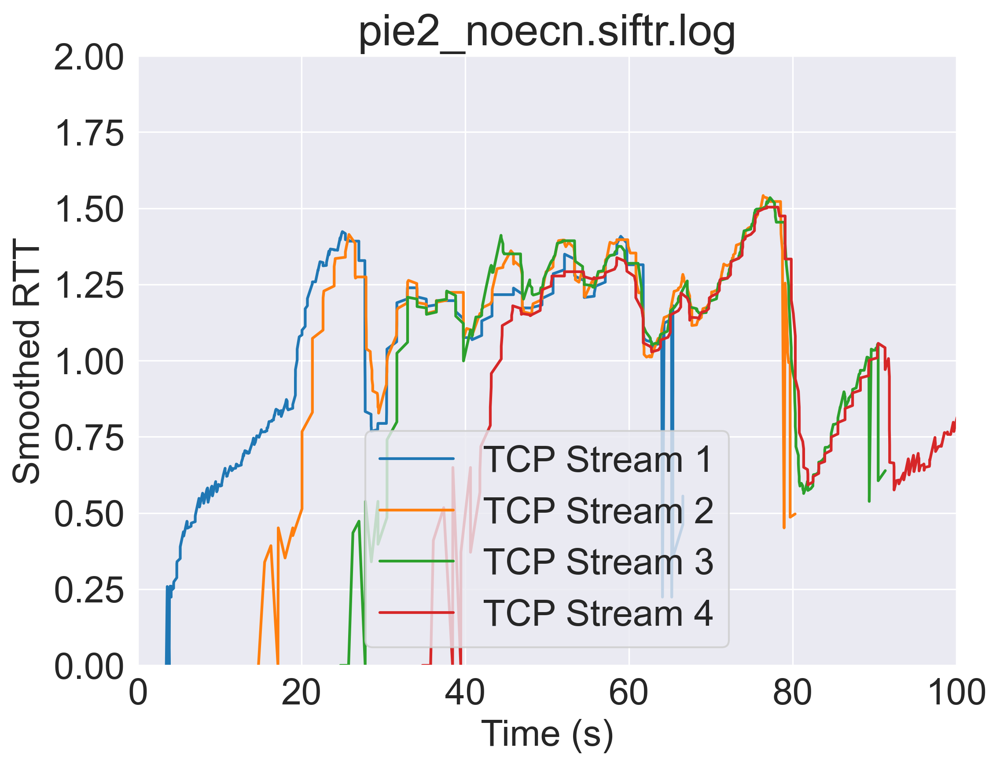

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


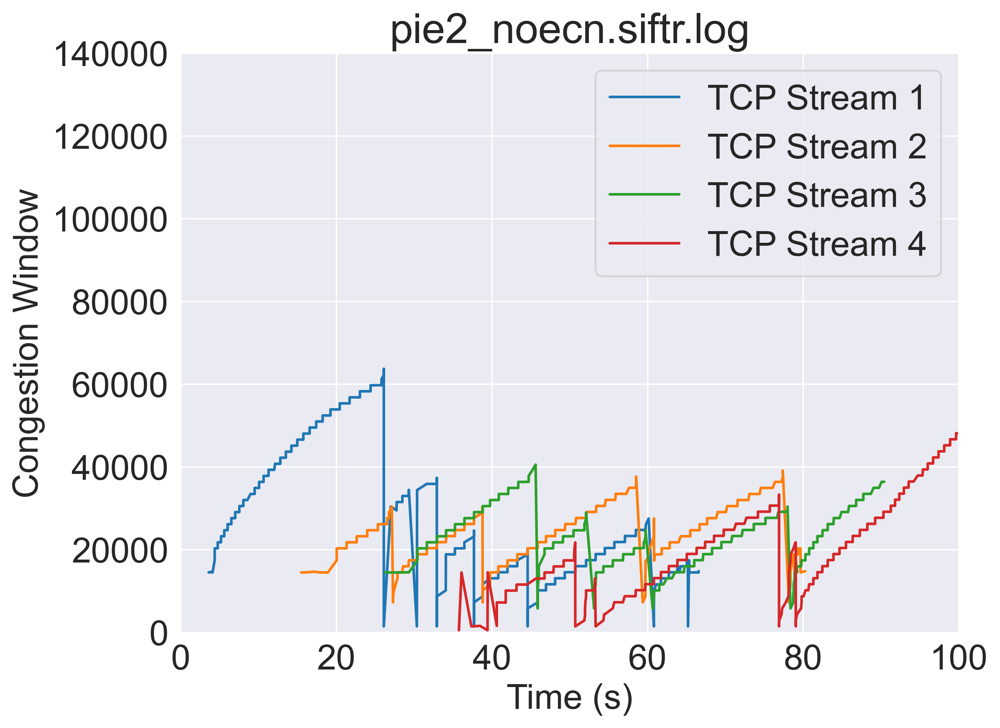

In [46]:
dataframe_list=[]
data_filename_list=[]
data_dict={}
for index in range(len(filenames)):
    # open d:/work/mptcp/twopathMPdata/test1/twopathtype1.siftr.log
    data = []
    with open("./datatest1/"+filenames[index], 'r') as f:
        # store the data
        for line in f:
            tem = re.sub(r'\s', '', line)
            data.append(tem.split(','))
    # remove file line of data
    print(filenames[index])
    data.pop(0)
    data.pop(len(data)-1)

    # define variables from enable_time_secs=1716792031	enable_time_usecs=061770	
    # siftrver=1.2.4 hz=100	tcp_rtt_scale=32	sysname=FreeBSD	sysver=1301000	ipmode=4
    enable_time_secs = 1716792031
    enable_time_usecs = 61770
    siftver = '1.2.4'
    hz = 100
    tcp_rtt_scale = 32
    sysname = 'FreeBSD'
    sysver = 1301000
    ipmode = 4



    df = pd.DataFrame(data, columns=col)

    df=df[df['Direction']=='o']

    # congestion window to int
    df = df.astype({'CongestionWindow': 'int32'})
    
    # Convert 'Time' column to float64 type
    df['Time'] = df['Time'].astype('float64')

    # Subtract the first time entry from all the entries in 'Time' column
    df['Time'] = df['Time'] - df['Time'].iloc[0]



    # remove rows that congestion window bigger than 70000
    # df = df[df['CongestionWindow'].astype(int) < 70000]
    # RTT divide by tcp_rtt_scale * hz
    df['SmoothedRTT'] = df['SmoothedRTT'].astype('float64')
    df['SmoothedRTT'] = df['SmoothedRTT'] / (tcp_rtt_scale * hz)
    df['SmoothedRTT'] = df['SmoothedRTT'].astype('float64')

    



    # first path ForeignPort = 5101
    dfPath1 = df.loc[(df['ForeignPort'] == '5101')]

    # second path localip = 5102
    dfPath2 = df.loc[(df['ForeignPort'] == '5102')]

    # third path ForeignPort = 5101
    dfPath3 = df.loc[(df['ForeignPort'] == '5103' )]

    # fourth path localip = 5102
    dfPath4 = df.loc[(df['ForeignPort'] == '5104')]
    
    # data_filename_list.append(filenames[index])
    # dataframe_list.append(dfPath1.copy())
    # data_dict[filenames[index]]=dfPath1.copy()
    print(dfPath4['SmoothedRTT'].describe())
    print(dfPath4['SmoothedRTT'].head(5))
    print(dfPath4['SmoothedRTT'].tail(5))

    # Darker color-blind-friendly palette
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
    # Different line styles and markers
    line_styles = ['-', '--', '-.', ':']
    #line_styles = ['-', '-', '-', '-']
    markers = ['o', 's', '^', 'D']

    


    

    # Plot Smoothed RTT vs Time
    #plt.figure(figsize=(7, 4.5))  # Set the figure size to fit within the column width
    plt.rcParams.update({'figure.figsize':(8,6), 'figure.dpi':300, 'font.size':20})
    sns.set_style("darkgrid")  # Set the style to darkgrid

    if contains_1_or_2(filenames[index]) == 1:
        plt.xlim(0,100)
        plt.ylim(0,2)
    elif contains_1_or_2(filenames[index]) == 2:
        plt.xlim(0,100)
        plt.ylim(0,2)
    
    # plt.plot(dfPath1['Time'], dfPath1['SmoothedRTT'], label='TCP Stream 1',
    #              color=colors[0], linestyle=line_styles[0])
    # plt.plot(dfPath2['Time'], dfPath2['SmoothedRTT'], label='TCP Stream 2',
    #              color=colors[1], linestyle=line_styles[1])
    # plt.plot(dfPath3['Time'], dfPath3['SmoothedRTT'], label='TCP Stream 3',
    #              color=colors[2], linestyle=line_styles[2])
    # plt.plot(dfPath4['Time'], dfPath4['SmoothedRTT'], label='TCP Stream 4',
    #              color=colors[3], linestyle=line_styles[3])
    
    plt.plot(dfPath1['Time'], dfPath1['SmoothedRTT'], label='TCP Stream 1',
                 color=colors[0])
    plt.plot(dfPath2['Time'], dfPath2['SmoothedRTT'], label='TCP Stream 2',
                 color=colors[1])
    plt.plot(dfPath3['Time'], dfPath3['SmoothedRTT'], label='TCP Stream 3',
                 color=colors[2])
    plt.plot(dfPath4['Time'], dfPath4['SmoothedRTT'], label='TCP Stream 4',
                 color=colors[3])
    
    plt.xlabel('Time (s)')
    plt.ylabel('Smoothed RTT')
    plt.title(filenames[index])
    plt.legend()
    plt.grid(True)
    # plt.savefig("./iperf3_tests/"+title+"-"+"Graphs.png", dpi=100,bbox_inches='tight')
    plt.savefig("./Graphs/"+filenames[index]+"_SmoothedRTT.png", dpi=300,bbox_inches='tight')
    plt.savefig("./Graphs/"+filenames[index]+"_SmoothedRTT.eps", dpi=300,bbox_inches='tight')
    plt.show()

    dfpath1_filtered = remove_outliers_iqr(dfPath1,"CongestionWindow")
    dfpath2_filtered = remove_outliers_iqr(dfPath2,"CongestionWindow")
    dfpath3_filtered = remove_outliers_iqr(dfPath3,"CongestionWindow")
    dfpath4_filtered = remove_outliers_iqr(dfPath4,"CongestionWindow")

    # Plot CWND vs Time
    #plt.figure(figsize=(7, 4.5))  # Set the figure size to fit within the column width
    plt.rcParams.update({'figure.figsize':(8,6), 'figure.dpi':300, 'font.size':20})
    sns.set_style("darkgrid")  # Set the style to darkgrid


    if contains_1_or_2(filenames[index]) == 1:
        plt.xlim(0,100)
        plt.ylim(0,140000)
    elif contains_1_or_2(filenames[index]) == 2:
        plt.xlim(0,100)
        plt.ylim(0,140000)
    

    
   
    # plt.plot(dfpath1_filtered['Time'], dfpath1_filtered['CongestionWindow'], label='TCP Stream 1',
    #              color=colors[0], linestyle=line_styles[0])
    # plt.plot(dfpath2_filtered['Time'], dfpath2_filtered['CongestionWindow'], label='TCP Stream 2',
    #              color=colors[1], linestyle=line_styles[1])
    # plt.plot(dfpath3_filtered['Time'], dfpath3_filtered['CongestionWindow'], label='TCP Stream 3',
    #              color=colors[2], linestyle=line_styles[2])
    # plt.plot(dfpath4_filtered['Time'], dfpath4_filtered['CongestionWindow'], label='TCP Stream 4',
    #              color=colors[3], linestyle=line_styles[3])
    

    plt.plot(dfpath1_filtered['Time'], dfpath1_filtered['CongestionWindow'], label='TCP Stream 1',
                 color=colors[0])
    plt.plot(dfpath2_filtered['Time'], dfpath2_filtered['CongestionWindow'], label='TCP Stream 2',
                 color=colors[1])
    plt.plot(dfpath3_filtered['Time'], dfpath3_filtered['CongestionWindow'], label='TCP Stream 3',
                 color=colors[2])
    plt.plot(dfpath4_filtered['Time'], dfpath4_filtered['CongestionWindow'], label='TCP Stream 4',
                 color=colors[3])
    
    plt.xlabel('Time (s)')
    plt.ylabel('Congestion Window')
    plt.title(filenames[index])
    plt.legend()
    plt.grid(True)
    # plt.savefig("./iperf3_tests/"+title+"-"+"Graphs.png", dpi=100,bbox_inches='tight')
    plt.savefig("./Graphs/"+filenames[index]+"_CWND.png", dpi=300,bbox_inches='tight')
    plt.savefig("./Graphs/"+filenames[index]+"_CWND.eps", dpi=300,bbox_inches='tight')
    plt.show()
    


In [47]:
# dataframe_list=[]
# data_filename_list=[]
# data_dict={}
# for index in range(len(filenames)):
#     # open d:/work/mptcp/twopathMPdata/test1/twopathtype1.siftr.log
#     data = []
#     with open("./datatest1/"+filenames[index], 'r') as f:
#         # store the data
#         for line in f:
#             tem = re.sub(r'\s', '', line)
#             data.append(tem.split(','))
#     # remove file line of data
#     data.pop(0)
#     data.pop(len(data)-1)

#     # define variables from enable_time_secs=1716792031	enable_time_usecs=061770	
#     # siftrver=1.2.4 hz=100	tcp_rtt_scale=32	sysname=FreeBSD	sysver=1301000	ipmode=4
#     enable_time_secs = 1716792031
#     enable_time_usecs = 61770
#     siftver = '1.2.4'
#     hz = 100
#     tcp_rtt_scale = 32
#     sysname = 'FreeBSD'
#     sysver = 1301000
#     ipmode = 4



#     df = pd.DataFrame(data, columns=col)

#     # congestion window to int
#     df = df.astype({'CongestionWindow': 'int32'})
    
#     # Convert 'Time' column to float64 type
#     df['Time'] = df['Time'].astype('float64')

#     # Subtract the first time entry from all the entries in 'Time' column
#     df['Time'] = df['Time'] - df['Time'].iloc[0]



#     # remove rows that congestion window bigger than 70000
#     # df = df[df['CongestionWindow'].astype(int) < 70000]
#     # RTT divide by tcp_rtt_scale * hz
#     df['SmoothedRTT'] = df['SmoothedRTT'].astype('float64')
#     df['SmoothedRTT'] = df['SmoothedRTT'] / (tcp_rtt_scale * hz)
#     df['SmoothedRTT'] = df['SmoothedRTT'].astype('float64')



#     # first path ForeignPort = 5101
#     dfPath1 = df.loc[(df['ForeignPort'] == '5101')]

#     # second path localip = 5102
#     dfPath2 = df.loc[(df['ForeignPort'] == '5102')]

#     # third path ForeignPort = 5101
#     dfPath3 = df.loc[(df['ForeignPort'] == '5103' )]

#     # fourth path localip = 5102
#     dfPath4 = df.loc[(df['ForeignPort'] == '5104')]
    
#     # data_filename_list.append(filenames[index])
#     # dataframe_list.append(dfPath1.copy())
#     # data_dict[filenames[index]]=dfPath1.copy()
#     print(dfPath4['SmoothedRTT'].describe())
#     print(dfPath4['SmoothedRTT'].head(5))
#     print(dfPath4['SmoothedRTT'].tail(5))


    

#     # Plot Smoothed RTT vs Time
#     plt.figure(figsize=(10, 6))
#     plt.plot(dfPath1['Time'], dfPath1['SmoothedRTT'], label='TCP Stream 1')
#     plt.plot(dfPath2['Time'], dfPath2['SmoothedRTT'], label='TCP Stream 2')
#     plt.plot(dfPath3['Time'], dfPath3['SmoothedRTT'], label='TCP Stream 3')
#     plt.plot(dfPath4['Time'], dfPath4['SmoothedRTT'], label='TCP Stream 4')
#     plt.xlabel('Time (s)')
#     plt.ylabel('Smoothed RTT')
#     plt.title(filenames[index])
#     plt.legend()
#     plt.grid(True)
#     plt.show()

#     # Plot CWND vs Time
#     plt.figure(figsize=(10, 6))
#     plt.plot(dfPath1['Time'], dfPath1['CongestionWindow'], label='TCP Stream 1')
#     plt.plot(dfPath2['Time'], dfPath2['CongestionWindow'], label='TCP Stream 2')
#     plt.plot(dfPath3['Time'], dfPath3['CongestionWindow'], label='TCP Stream 3')
#     plt.plot(dfPath4['Time'], dfPath4['CongestionWindow'], label='TCP Stream 4')
#     plt.xlabel('Time (s)')
#     plt.ylabel('Congestion Window')
#     plt.title(filenames[index])
#     plt.legend()
#     plt.grid(True)
#     plt.show()

    
#     break;
    


In [48]:
for i in range(len(col)):
    print(i,end=",")
    print(col[i])


0,Direction
1,Hash
2,Time
3,LocalIP
4,LocalPort
5,ForeignIP
6,ForeignPort
7,SlowStartThreshold
8,CongestionWindow
9,BandwidthControlledWindow
10,SendingWindow
11,ReceiveWindow
12,SendingWindowScalingFactor
13,ReceiveWindowScalingFactor
14,TCPFiniteStateMachine
15,MaximumSegmentSize
16,SmoothedRTT
17,SACKEnabled
18,TCPFlags
19,RetransmissionTimeout
20,SocketSendBufferSize
21,SocketSendBufferBytes
22,SocketReceiveBufferSize
23,SocketReceiveBufferBytes
24,UnacknowledgedBytes
25,ReassemblyQueue
26,Flowid
27,Flowtype
